# PIP install

In [ ]:
pip install monai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 14.5 MB/s eta 0:00:00


In [ ]:
!git clone https://github.com/bowang-lab/MedSAM

Cloning into 'MedSAM'...
remote: Enumerating objects: 432, done.
remote: Counting objects: 100% (214/214), done.
remote: Compressing objects: 100% (112/112), done.
remote: Total 432 (delta 148), reused 102 (delta 102), pack-reused 218
Receiving objects: 100% (432/432), 56.01 MiB | 30.56 MiB/s, done.
Resolving deltas: 100% (209/209), done.


In [ ]:
pip install git+https://github.com/facebookresearch/segment-anything.git

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-7i80g04e
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-7i80g04e
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36586 sha256=4741e9810ad3e54401a7f194d8dba08eec4855c1b429c122954e3d081625bb6d
  Stored in directory: /tmp/pip-ephem-wheel-cache-ok9y8ecw/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything


In [ ]:
from MedSAM.utils.SurfaceDice import compute_dice_coefficient

In [ ]:
pip install SimpleITK

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 11.3 MB/s eta 0:00:00


# Imports,Funcs,Classes

In [ ]:
import os
import torch
join = os.path.join
import numpy as np
from tqdm import tqdm
import SimpleITK as sitk
import matplotlib.pyplot as plt
from skimage import transform, io, segmentation
# from segment_anything import SamPredictor, sam_model_registry
# from segment_anything.utils.transforms import ResizeLongestSide
from MedSAM.segment_anything import SamPredictor, sam_model_registry
from MedSAM.segment_anything.utils.transforms import ResizeLongestSide
from torch.utils.data import Dataset, DataLoader
import monai
np.random.seed(2023)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
class NpzDataset(Dataset):
    def __init__(self, data_root):
        self.data_root = data_root
        self.npz_files = sorted(os.listdir(self.data_root))
        self.npz_data = [np.load(join(data_root, f)) for f in self.npz_files]
        # this implementation is ugly but it works (and is also fast for feeding data to GPU) if your server has enough RAM
        # as an alternative, you can also use a list of npy files and load them one by one
        self.ori_gts = np.vstack([d['gts'].astype("float32") for d in self.npz_data])
        self.img_embeddings = np.vstack([d['img_embeddings'] for d in self.npz_data])
        self.imgs = np.vstack([d['imgs'] for d in self.npz_data])
        print(f"{self.img_embeddings.shape=}, {self.ori_gts.shape=}")

    def __len__(self):
        return self.ori_gts.shape[0]

    def __getitem__(self, index):
        img_embed = self.img_embeddings[index]
        gt2D = self.ori_gts[index]
        img = self.imgs[index]
        y_indices, x_indices = np.where(gt2D > 0)
        x_min, x_max = np.min(x_indices), np.max(x_indices)
        y_min, y_max = np.min(y_indices), np.max(y_indices)
        # add perturbation to bounding box coordinates
        H, W = gt2D.shape
        x_min = max(0, x_min - np.random.randint(0, 20))
        x_max = min(W, x_max + np.random.randint(0, 20))
        y_min = max(0, y_min - np.random.randint(0, 20))
        y_max = min(H, y_max + np.random.randint(0, 20))
        bboxes = np.array([x_min, y_min, x_max, y_max])
        # convert img embedding, mask, bounding box to torch tensor
        return torch.tensor(img),torch.tensor(img_embed).float(), torch.tensor(gt2D[None, :,:]).long(), torch.tensor(bboxes).float()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def find_bounding_box(segmentation_map):
    # Find indices of non-zero elements in the segmentation map
    rows, cols = np.nonzero(segmentation_map)

    # Calculate the bounding box coordinates
    min_row = np.min(rows)
    max_row = np.max(rows)
    min_col = np.min(cols)
    max_col = np.max(cols)

    # Return the bounding box coordinates as (x_min, y_min, width, height)
    width = max_col - min_col + 1
    height = max_row - min_row + 1
    return np.array([min_col, min_row, width, height])

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([251/255, 252/255, 30/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def plot_bounding_box(bbox, image):
    # Create a figure and axis
    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(image)

    # Extract the coordinates from the bbox array
    x_min, y_min, x_max, y_max = bbox

    # Calculate the width and height of the box
    width = x_max - x_min
    height = y_max - y_min

    # Create a rectangle patch
    rect = plt.Rectangle((x_min, y_min), width, height,
                         linewidth=2, edgecolor='r', facecolor='none')

    # Add the rectangle patch to the axis
    ax.add_patch(rect)

    # Set the aspect ratio of the axis to 'equal'
    ax.set_aspect('equal')

    # Show the plot
    plt.show()


# New Section

In [ ]:
# checking

root = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/782_images_Small_box_No_val/data_FLARE22_more_patients/Npz_files/CT_Abd-Adrenal/train"
npz = os.listdir(root)
# print(npz)
total_gts = 0
total_images = 0
total_embeddings = 0

for i in npz:
    path = os.path.join(root,i)
    loaded = np.load(path)
    # print(loaded["gts"].dtype)
    # print(loaded["imgs"].dtype)
    # print(loaded["img_embeddings"].dtype)
    total_gts+= loaded["gts"].shape[0]
    total_images += loaded["imgs"].shape[0]
    total_embeddings += loaded["img_embeddings"].shape[0]

print(total_gts)
print(total_images)
print(total_embeddings)

# ONLY 433 images

782
782
782


In [ ]:
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

# train data path
npz_train_path = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/782_images_Small_box_No_val/data_FLARE22_more_patients/Npz_files/CT_Abd-Adrenal/train"
# work_dir = './work_dir'
# task_name = 'CT_Abd-Adrenal'
# # prepare SAM model
# model_type = 'vit_b'
# checkpoint = '/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/SAM/sam_vit_b_01ec64 (1).pth'
# device = 'cuda:0'
# model_save_path = join("/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/Training_July/Medsam_Diff_training_dicts", task_name)

# os.makedirs(model_save_path, exist_ok=True)

# Set up the optimizer, hyperparameter tuning will improve performance here
# optimizer = torch.optim.Adam(sam_model.mask_decoder.parameters(), lr=1e-5, weight_decay=0)

# # reduces the LR by 0.1 when loss plateaus
# # lr_scheduler = ReduceLROnPlateau(optimizer, factor=0.1, patience=5)

# seg_loss = monai.losses.DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')

In [ ]:
train_dataset = NpzDataset(npz_train_path)
train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True)

self.img_embeddings.shape=(782, 256, 64, 64), self.ori_gts.shape=(782, 256, 256)


In [ ]:
for step, (img,image_embedding, gt2D, boxes) in enumerate(tqdm(train_dataloader)):
      print(step)
      print("image : ")
      plt.imshow(img.detach().numpy()[0])
      plt.show()
      print()
      plot_bounding_box(boxes.detach().numpy()[0],img.detach().numpy()[0])
      plt.imshow(gt2D[0][0],cmap = 'gray')
      plt.show()
      # print("Box shape : ",boxes.detach().numpy().shape)
      # print("Gt shape : ",gt2D.detach().numpy().shape)
      break

NameError: ignored

TRAINING ONLY MASK DECODER

# ONLY DECODER , 200 EPOCHS

In [ ]:
# LOSS FUNCTION 2

def iou(predicted_mask, target_mask):
    intersection = torch.logical_and(predicted_mask, target_mask).sum()
    union = torch.logical_or(predicted_mask, target_mask).sum()
    iou_score = intersection.float() / union.float()
    return iou_score

class IoULoss(torch.nn.Module):
    def __init__(self):
        super(IoULoss, self).__init__()

    def forward(self, predicted_mask, target_mask):
        iou_score = iou(predicted_mask, target_mask)
        iou_loss = 1.0 - iou_score
        return iou_loss

In [ ]:
model_save = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/782_images_Small_box_No_val/Medsam_Diff_training_dicts/CT_Abd-Adrenal-2"
npz_train_path = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/782_images_Small_box_No_val/data_FLARE22_more_patients/Npz_files/CT_Abd-Adrenal/train"

train_dataset = NpzDataset(npz_train_path)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

self.img_embeddings.shape=(782, 256, 64, 64), self.ori_gts.shape=(782, 256, 256)


In [ ]:
# CHANGE THIS PATH WHEN TRAINING ANOTHER MODEL
model_save = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/782_images_Small_box_No_val/Medsam_Diff_training_dicts/Full_Box_200E"

In [ ]:
checkpoint = '/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/SAM/sam_vit_b_01ec64 (1).pth'
sam_model = sam_model_registry['vit_b'](checkpoint=checkpoint).to(device)
sam_model.train()

optimizer = torch.optim.Adam(sam_model.mask_decoder.parameters(), lr=1e-4, weight_decay=0)
seg_loss = monai.losses.DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')

# iou_loss = IoULoss()

num_epochs = 200
losses = []
best_loss = 1e10

# regularization strength
reg_strength = 1e-4

for epoch in range(num_epochs):
    epoch_loss = 0
    # train
    for step, (img,image_embedding, gt2D, boxes) in enumerate(tqdm(train_dataloader)):
        with torch.no_grad():
            # convert box to 1024x1024 grid
            # box_np = boxes.numpy()

            box_np = np.array([0,0,256,256])

            sam_trans = ResizeLongestSide(sam_model.image_encoder.img_size)
            box = sam_trans.apply_boxes(box_np, (gt2D.shape[-2], gt2D.shape[-1]))
            box_torch = torch.as_tensor(box, dtype=torch.float, device=device)
            if len(box_torch.shape) == 2:
                box_torch = box_torch[:, None, :] # (B, 1, 4)

            sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                points=None,
                boxes=box_torch,
                masks=None,
            )
        mask_predictions, _ = sam_model.mask_decoder(
            image_embeddings=image_embedding.to(device), # (B, 256, 64, 64)
            image_pe=sam_model.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
            sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
            dense_prompt_embeddings=dense_embeddings, # (B, 256, 64, 64)
            multimask_output=False,
          )

        # mask preds is float32
        # label is int64 ,
        # convert label also to float32

        gt2D = gt2D.to(torch.float32)

        # VISUALIZE OUTPUTS
        # medsam_seg_prob = torch.sigmoid(mask_predictions)
        # # convert soft mask to hard mask
        # medsam_seg_prob = medsam_seg_prob[0].detach().cpu().numpy().squeeze()
        # medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)
        # print(medsam_seg.dtype)
        # plt.imshow(medsam_seg,cmap = 'gray')
        # plt.show()

        # break
        loss = seg_loss(mask_predictions, gt2D.to(device))

        # l2_reg_loss = 0
        # for param in sam_model.parameters():
        #     l2_reg_loss += torch.norm(param)

        # # Add regularization term to the loss to avoid overfitting
        # total_loss = loss + reg_strength * l2_reg_loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()


        # lr_scheduler.step(loss)

        epoch_loss += loss.item()
    # break
    epoch_loss /= step
    losses.append(epoch_loss)
    print(f'EPOCH: {epoch}, Loss: {epoch_loss}')
    # save the latest model checkpoint
    torch.save(sam_model.state_dict(), join(model_save, f'sam_model_latest,E:{num_epochs}.pth'))
    # save the best model
    if epoch_loss < best_loss:
        best_loss = epoch_loss
        torch.save(sam_model.state_dict(), join(model_save, f'sam_model_best,E:{num_epochs}.pth'))

100%|██████████| 25/25 [00:10<00:00,  2.35it/s]


EPOCH: 0, Loss: 0.9666930188735327


100%|██████████| 25/25 [00:11<00:00,  2.18it/s]


EPOCH: 1, Loss: 0.7888244738181432


100%|██████████| 25/25 [00:11<00:00,  2.19it/s]


EPOCH: 2, Loss: 0.7218383525808653


100%|██████████| 25/25 [00:11<00:00,  2.24it/s]


EPOCH: 3, Loss: 0.7276548345883688


100%|██████████| 25/25 [00:10<00:00,  2.30it/s]


EPOCH: 4, Loss: 0.6849175343910853


100%|██████████| 25/25 [00:11<00:00,  2.19it/s]


EPOCH: 5, Loss: 0.6707747156421343


100%|██████████| 25/25 [00:10<00:00,  2.28it/s]


EPOCH: 6, Loss: 0.6569064805905024


100%|██████████| 25/25 [00:11<00:00,  2.09it/s]


EPOCH: 7, Loss: 0.6513528948028883


100%|██████████| 25/25 [00:11<00:00,  2.20it/s]


EPOCH: 8, Loss: 0.7514577905337015


100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


EPOCH: 9, Loss: 0.7198630198836327


100%|██████████| 25/25 [00:10<00:00,  2.31it/s]


EPOCH: 10, Loss: 0.661430669327577


100%|██████████| 25/25 [00:10<00:00,  2.32it/s]


EPOCH: 11, Loss: 0.6561106542746226


100%|██████████| 25/25 [00:10<00:00,  2.28it/s]


EPOCH: 12, Loss: 0.6621641019980112


100%|██████████| 25/25 [00:10<00:00,  2.34it/s]


EPOCH: 13, Loss: 0.6909329183399677


100%|██████████| 25/25 [00:10<00:00,  2.28it/s]


EPOCH: 14, Loss: 0.7198289359609286


100%|██████████| 25/25 [00:10<00:00,  2.32it/s]


EPOCH: 15, Loss: 0.7487662931283315


100%|██████████| 25/25 [00:10<00:00,  2.38it/s]


EPOCH: 16, Loss: 0.7853408455848694


100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


EPOCH: 17, Loss: 0.727975698808829


100%|██████████| 25/25 [00:10<00:00,  2.30it/s]


EPOCH: 18, Loss: 0.7288160063326359


100%|██████████| 25/25 [00:11<00:00,  2.26it/s]


EPOCH: 19, Loss: 0.8117833683888117


100%|██████████| 25/25 [00:11<00:00,  2.13it/s]


EPOCH: 20, Loss: 0.8296115696430206


100%|██████████| 25/25 [00:11<00:00,  2.27it/s]


EPOCH: 21, Loss: 0.8245892624060313


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 22, Loss: 0.8312856629490852


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 23, Loss: 0.8329597637057304


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 24, Loss: 0.8262633507450422


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 25, Loss: 0.8279374515016874


100%|██████████| 25/25 [00:10<00:00,  2.40it/s]


EPOCH: 26, Loss: 0.829611582060655


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 27, Loss: 0.826263315975666


100%|██████████| 25/25 [00:11<00:00,  2.27it/s]


EPOCH: 28, Loss: 0.8312856803337733


100%|██████████| 25/25 [00:10<00:00,  2.41it/s]


EPOCH: 29, Loss: 0.8279374515016874


100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


EPOCH: 30, Loss: 0.8329597786068916


100%|██████████| 25/25 [00:10<00:00,  2.28it/s]


EPOCH: 31, Loss: 0.8262633557120959


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 32, Loss: 0.8312856629490852


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 33, Loss: 0.8279374813040098


100%|██████████| 25/25 [00:10<00:00,  2.39it/s]


EPOCH: 34, Loss: 0.8296115597089132


100%|██████████| 25/25 [00:10<00:00,  2.34it/s]


EPOCH: 35, Loss: 0.8329597686727842


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 36, Loss: 0.8312856629490852


100%|██████████| 25/25 [00:10<00:00,  2.33it/s]


EPOCH: 37, Loss: 0.826263373096784


100%|██████████| 25/25 [00:10<00:00,  2.42it/s]


EPOCH: 38, Loss: 0.829611579577128


100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


EPOCH: 39, Loss: 0.8296115671594938


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 40, Loss: 0.8279374664028486


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 41, Loss: 0.8262633631626765


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 42, Loss: 0.8279374862710634


100%|██████████| 25/25 [00:10<00:00,  2.38it/s]


EPOCH: 43, Loss: 0.8312856877843539


100%|██████████| 25/25 [00:10<00:00,  2.40it/s]


EPOCH: 44, Loss: 0.8279374887545904


100%|██████████| 25/25 [00:10<00:00,  2.38it/s]


EPOCH: 45, Loss: 0.8279374788204829


100%|██████████| 25/25 [00:10<00:00,  2.35it/s]


EPOCH: 46, Loss: 0.8296115597089132


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 47, Loss: 0.8279374738534292


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 48, Loss: 0.8329597786068916


100%|██████████| 25/25 [00:10<00:00,  2.39it/s]


EPOCH: 49, Loss: 0.8329597786068916


100%|██████████| 25/25 [00:10<00:00,  2.31it/s]


EPOCH: 50, Loss: 0.8279374515016874


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 51, Loss: 0.8329597786068916


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 52, Loss: 0.8312856604655584


100%|██████████| 25/25 [00:10<00:00,  2.33it/s]


EPOCH: 53, Loss: 0.8312856256961823


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 54, Loss: 0.8329597885409991


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 55, Loss: 0.8296115770936012


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 56, Loss: 0.8212410447498163


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 57, Loss: 0.8312856381138166


100%|██████████| 25/25 [00:10<00:00,  2.42it/s]


EPOCH: 58, Loss: 0.8262633656462034


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 59, Loss: 0.8296115671594938


100%|██████████| 25/25 [00:10<00:00,  2.41it/s]


EPOCH: 60, Loss: 0.8279374415675799


100%|██████████| 25/25 [00:10<00:00,  2.38it/s]


EPOCH: 61, Loss: 0.82961156219244


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 62, Loss: 0.8245892425378164


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 63, Loss: 0.8329597885409991


100%|██████████| 25/25 [00:10<00:00,  2.33it/s]


EPOCH: 64, Loss: 0.8245892326037089


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 65, Loss: 0.826263370613257


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 66, Loss: 0.8312856629490852


100%|██████████| 25/25 [00:10<00:00,  2.35it/s]


EPOCH: 67, Loss: 0.8312856877843539


100%|██████████| 25/25 [00:10<00:00,  2.40it/s]


EPOCH: 68, Loss: 0.827937439084053


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 69, Loss: 0.832959733903408


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 70, Loss: 0.8262633482615153


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 71, Loss: 0.8296115696430206


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 72, Loss: 0.8296115597089132


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 73, Loss: 0.8329597835739454


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 74, Loss: 0.8296115845441818


100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


EPOCH: 75, Loss: 0.8296115721265475


100%|██████████| 25/25 [00:10<00:00,  2.40it/s]


EPOCH: 76, Loss: 0.8312856629490852


100%|██████████| 25/25 [00:10<00:00,  2.42it/s]


EPOCH: 77, Loss: 0.8312856828173002


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 78, Loss: 0.8312856455643972


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 79, Loss: 0.8312856753667196


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 80, Loss: 0.829611544807752


100%|██████████| 25/25 [00:10<00:00,  2.40it/s]


EPOCH: 81, Loss: 0.8296115845441818


100%|██████████| 25/25 [00:10<00:00,  2.35it/s]


EPOCH: 82, Loss: 0.826263353228569


100%|██████████| 25/25 [00:10<00:00,  2.38it/s]


EPOCH: 83, Loss: 0.8245892375707626


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 84, Loss: 0.8296115696430206


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 85, Loss: 0.8346338992317518


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 86, Loss: 0.8312856728831927


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 87, Loss: 0.8329597612222036


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 88, Loss: 0.8245892226696014


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 89, Loss: 0.82961156219244


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 90, Loss: 0.8312856753667196


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 91, Loss: 0.8279374738534292


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 92, Loss: 0.8296115522583326


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 93, Loss: 0.8312856530149778


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 94, Loss: 0.8296115547418594


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 95, Loss: 0.8296115572253863


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 96, Loss: 0.8312856530149778


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 97, Loss: 0.822915144264698


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 98, Loss: 0.8312856604655584


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 99, Loss: 0.827937476336956


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 100, Loss: 0.8296115845441818


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 101, Loss: 0.8296115398406982


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 102, Loss: 0.8296115746100744


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 103, Loss: 0.8346338967482249


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 104, Loss: 0.8279374614357948


100%|██████████| 25/25 [00:10<00:00,  2.50it/s]


EPOCH: 105, Loss: 0.8296115572253863


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 106, Loss: 0.8346338694294294


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 107, Loss: 0.8329598059256872


100%|██████████| 25/25 [00:10<00:00,  2.39it/s]


EPOCH: 108, Loss: 0.8296115348736445


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 109, Loss: 0.8329597612222036


100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


EPOCH: 110, Loss: 0.8329597786068916


100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


EPOCH: 111, Loss: 0.8346338992317518


100%|██████████| 25/25 [00:10<00:00,  2.35it/s]


EPOCH: 112, Loss: 0.8312856728831927


100%|██████████| 25/25 [00:09<00:00,  2.51it/s]


EPOCH: 113, Loss: 0.8245892648895582


100%|██████████| 25/25 [00:10<00:00,  2.42it/s]


EPOCH: 114, Loss: 0.8329597835739454


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 115, Loss: 0.8312856604655584


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 116, Loss: 0.8329597587386767


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 117, Loss: 0.8312856703996658


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 118, Loss: 0.826263353228569


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 119, Loss: 0.8279374738534292


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 120, Loss: 0.8312856803337733


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 121, Loss: 0.8312856877843539


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 122, Loss: 0.8346338917811712


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 123, Loss: 0.8229151591658592


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 124, Loss: 0.8296115572253863


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 125, Loss: 0.829611579577128


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 126, Loss: 0.8279374539852142


100%|██████████| 25/25 [00:10<00:00,  2.32it/s]


EPOCH: 127, Loss: 0.8329597761233648


100%|██████████| 25/25 [00:10<00:00,  2.36it/s]


EPOCH: 128, Loss: 0.8329597686727842


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 129, Loss: 0.8312856629490852


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 130, Loss: 0.826263353228569


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 131, Loss: 0.8262633432944616


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 132, Loss: 0.8245892599225044


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 133, Loss: 0.8279374688863754


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 134, Loss: 0.822915144264698


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 135, Loss: 0.8279374639193217


100%|██████████| 25/25 [00:10<00:00,  2.40it/s]


EPOCH: 136, Loss: 0.8279374688863754


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 137, Loss: 0.8279374813040098


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 138, Loss: 0.8312856778502464


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 139, Loss: 0.831285685300827


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 140, Loss: 0.8312856703996658


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 141, Loss: 0.8296115597089132


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 142, Loss: 0.8329597512880961


100%|██████████| 25/25 [00:10<00:00,  2.41it/s]


EPOCH: 143, Loss: 0.824589249988397


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 144, Loss: 0.8329597835739454


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 145, Loss: 0.8312856877843539


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 146, Loss: 0.8279374813040098


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 147, Loss: 0.8312856604655584


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 148, Loss: 0.8296115721265475


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 149, Loss: 0.8312856604655584


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 150, Loss: 0.8279374862710634


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 151, Loss: 0.82961156219244


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 152, Loss: 0.8279374788204829


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 153, Loss: 0.8312856455643972


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 154, Loss: 0.8296115845441818


100%|██████████| 25/25 [00:10<00:00,  2.38it/s]


EPOCH: 155, Loss: 0.8312856579820315


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 156, Loss: 0.8279374465346336


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 157, Loss: 0.8296115696430206


100%|██████████| 25/25 [00:10<00:00,  2.35it/s]


EPOCH: 158, Loss: 0.8296115696430206


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 159, Loss: 0.824589267373085


100%|██████████| 25/25 [00:09<00:00,  2.51it/s]


EPOCH: 160, Loss: 0.8329597736398379


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 161, Loss: 0.8312856902678808


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 162, Loss: 0.8346338793635368


100%|██████████| 25/25 [00:10<00:00,  2.41it/s]


EPOCH: 163, Loss: 0.8329597984751066


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 164, Loss: 0.829611544807752


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 165, Loss: 0.8279374688863754


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 166, Loss: 0.8262633581956228


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 167, Loss: 0.8229151554405689


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 168, Loss: 0.8262633333603541


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 169, Loss: 0.8279374539852142


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 170, Loss: 0.8312856753667196


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 171, Loss: 0.8296115870277087


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 172, Loss: 0.8296115646759669


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 173, Loss: 0.8262633432944616


100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


EPOCH: 174, Loss: 0.8279374713699023


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 175, Loss: 0.8296115646759669


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 176, Loss: 0.8346338917811712


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 177, Loss: 0.829611582060655


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 178, Loss: 0.8312856803337733


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 179, Loss: 0.8279374887545904


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 180, Loss: 0.8296115572253863


100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


EPOCH: 181, Loss: 0.8262633283933004


100%|██████████| 25/25 [00:10<00:00,  2.43it/s]


EPOCH: 182, Loss: 0.8296115646759669


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 183, Loss: 0.8279374614357948


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 184, Loss: 0.8312856505314509


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 185, Loss: 0.8329597612222036


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 186, Loss: 0.8346338694294294


100%|██████████| 25/25 [00:10<00:00,  2.49it/s]


EPOCH: 187, Loss: 0.822915135572354


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 188, Loss: 0.8245892475048701


100%|██████████| 25/25 [00:09<00:00,  2.51it/s]


EPOCH: 189, Loss: 0.8262633631626765


100%|██████████| 25/25 [00:10<00:00,  2.46it/s]


EPOCH: 190, Loss: 0.829611582060655


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 191, Loss: 0.829611544807752


100%|██████████| 25/25 [00:10<00:00,  2.50it/s]


EPOCH: 192, Loss: 0.8296115671594938


100%|██████████| 25/25 [00:10<00:00,  2.44it/s]


EPOCH: 193, Loss: 0.8312856753667196


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 194, Loss: 0.8279374490181605


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 195, Loss: 0.8245892450213432


100%|██████████| 25/25 [00:10<00:00,  2.47it/s]


EPOCH: 196, Loss: 0.8296115398406982


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 197, Loss: 0.8279374465346336


100%|██████████| 25/25 [00:10<00:00,  2.45it/s]


EPOCH: 198, Loss: 0.8329597463210424


100%|██████████| 25/25 [00:10<00:00,  2.40it/s]


EPOCH: 199, Loss: 0.8329597835739454


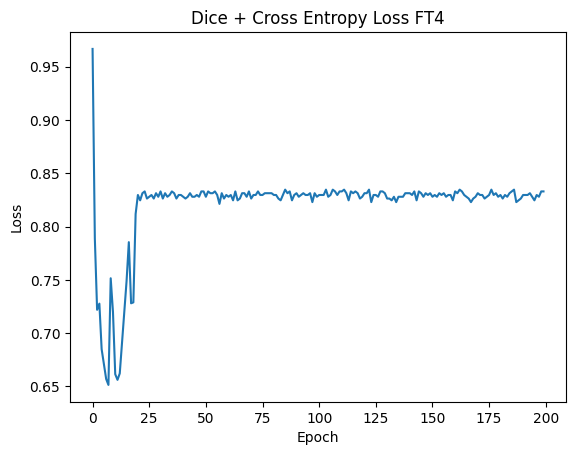

In [ ]:
plt.plot(losses)
plt.title('Dice + Cross Entropy Loss FT4')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()
plt.savefig(join(model_save, 'train_loss.png'))
plt.close()

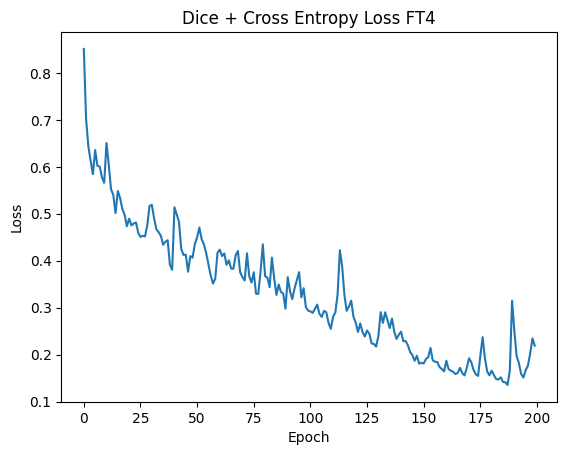

In [ ]:
# THIS IS ONLY MASK DECODER WITH 200 epochs

plt.plot(losses)
plt.title('Dice + Cross Entropy Loss FT4')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()
plt.savefig(join(model_save, 'train_loss.png'))
plt.close()

In [ ]:
# #%% compare the segmentation results between the original SAM model and the fine-tuned model
# # load the original SAM model
# ori_sam_model = sam_model_registry[model_type](checkpoint=checkpoint).to(device)
# ori_sam_predictor = SamPredictor(ori_sam_model)
# npz_ts_path = '/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/data/Npz_files/CT_Abd-Adrenal/test'
# test_npzs = sorted(os.listdir(npz_ts_path))

# # random select a test case
# npz_idx = np.random.randint(0, len(test_npzs))
# npz = np.load(join(npz_ts_path, test_npzs[npz_idx]))
# imgs = npz['imgs']
# gts = npz['gts']

# def get_bbox_from_mask(mask):
#     '''Returns a bounding box from a mask'''
#     y_indices, x_indices = np.where(mask > 0)
#     x_min, x_max = np.min(x_indices), np.max(x_indices)
#     y_min, y_max = np.min(y_indices), np.max(y_indices)
#     # add perturbation to bounding box coordinates
#     H, W = mask.shape
#     x_min = max(0, x_min - np.random.randint(0, 20))
#     x_max = min(W, x_max + np.random.randint(0, 20))
#     y_min = max(0, y_min - np.random.randint(0, 20))
#     y_max = min(H, y_max + np.random.randint(0, 20))

#     return np.array([x_min, y_min, x_max, y_max])

# ori_sam_segs = []
# medsam_segs = []
# bboxes = []
# for img, gt in zip(imgs, gts):

#     bbox = get_bbox_from_mask(gt)

#     bboxes.append(bbox)
#     # predict the segmentation mask using the original SAM model
#     ori_sam_predictor.set_image(img)
#     ori_sam_seg, _, _ = ori_sam_predictor.predict(point_coords=None, box=bbox, multimask_output=False)
#     ori_sam_segs.append(ori_sam_seg[0])

#     # predict the segmentation mask using the fine-tuned model
#     H, W = img.shape[:2]
#     resize_img = sam_trans.apply_image(img)
#     resize_img_tensor = torch.as_tensor(resize_img.transpose(2, 0, 1)).to(device)
#     input_image = sam_model.preprocess(resize_img_tensor[None,:,:,:]) # (1, 3, 1024, 1024)
#     with torch.no_grad():
#         image_embedding = sam_model.image_encoder(input_image.to(device)) # (1, 256, 64, 64)
#         # convert box to 1024x1024 grid
#         bbox = sam_trans.apply_boxes(bbox, (H, W))
#         box_torch = torch.as_tensor(bbox, dtype=torch.float, device=device)
#         if len(box_torch.shape) == 2:
#             box_torch = box_torch[:, None, :] # (B, 1, 4)

#         sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
#             points=None,
#             boxes=box_torch,
#             masks=None,
#         )
#         medsam_seg_prob, _ = sam_model.mask_decoder(
#             image_embeddings=image_embedding.to(device), # (B, 256, 64, 64)
#             image_pe=sam_model.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
#             sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
#             dense_prompt_embeddings=dense_embeddings, # (B, 256, 64, 64)
#             multimask_output=False,
#             )
#         medsam_seg_prob = torch.sigmoid(medsam_seg_prob)
#         # convert soft mask to hard mask
#         medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
#         medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)
#         medsam_segs.append(medsam_seg)

In [ ]:
# #%% compute the DSC score
# ori_sam_segs = np.stack(ori_sam_segs, axis=0)
# medsam_segs = np.stack(medsam_segs, axis=0)
# ori_sam_dsc = compute_dice_coefficient(gts>0, ori_sam_segs>0)
# medsam_dsc = compute_dice_coefficient(gts>0, medsam_segs>0)
# print('Original SAM DSC: {:.4f}'.format(ori_sam_dsc), 'MedSAM DSC: {:.4f}'.format(medsam_dsc))

Original SAM DSC: 0.1452 MedSAM DSC: 0.0934


In [ ]:
# def show_mask(mask, ax, random_color=False):
#     if random_color:
#         color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
#     else:
#         # color = np.array([251/255, 252/255, 30/255, 0.6])
#         color = np.array([1.0, 0.0, 0.0, 1.0], dtype=np.float32)
#     h, w = mask.shape[-2:]
#     mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
#     ax.imshow(mask_image)

# def show_box(box, ax):
#     x0, y0 = box[0], box[1]
#     w, h = box[2] - box[0], box[3] - box[1]
#     ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='blue', facecolor=(0,0,0,0), lw=2))


# img_id = int(imgs.shape[0]/2)  # np.random.randint(imgs.shape[0])
# _, axs = plt.subplots(1, 3, figsize=(25, 25))
# axs[0].imshow(imgs[img_id])
# show_mask(gts[img_id], axs[0])
# # show_box(box_np[img_id], axs[0])
# # axs[0].set_title('Mask with Tuned Model', fontsize=20)
# axs[0].axis('off')

# axs[1].imshow(imgs[img_id])
# show_mask(ori_sam_segs[img_id], axs[1])
# show_box(bboxes[img_id], axs[1])
# # add text to image to show dice score
# axs[1].text(0.5, 0.5, 'SAM DSC: {:.4f}'.format(ori_sam_dsc), fontsize=30, horizontalalignment='left', verticalalignment='top', color='yellow')
# # axs[1].set_title('Mask with Untuned Model', fontsize=20)
# axs[1].axis('off')

# axs[2].imshow(imgs[img_id])
# show_mask(medsam_segs[img_id], axs[2])
# show_box(bboxes[img_id], axs[2])
# # add text to image to show dice score
# axs[2].text(0.5, 0.5, 'MedSAM DSC: {:.4f} FT4'.format(medsam_dsc), fontsize=30, horizontalalignment='left', verticalalignment='top', color='yellow')
# # axs[2].set_title('Ground Truth', fontsize=20)
# axs[2].axis('off')
# plt.show()
# plt.subplots_adjust(wspace=0.01, hspace=0)
# # save plot
# plt.close()


# ALL PARAMETERS 125 EPOCHS loss : 0.33

In [ ]:
sam_model = sam_model_registry[model_type](checkpoint=checkpoint).to(device)
sam_model.train()

optimizer = torch.optim.Adam(sam_model.parameters(), lr=1e-5, weight_decay=0)
seg_loss = monai.losses.DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')

num_epochs = 125
losses = []
best_loss = 1e10
train_dataset = NpzDataset(npz_tr_path)
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)

for epoch in range(num_epochs):
    epoch_loss = 0
    # train
    for step, (img,image_embedding, gt2D, boxes) in enumerate(tqdm(train_dataloader)):
        # do not compute gradients for image encoder and prompt encoder
        # with torch.no_grad():
            # convert box to 1024x1024 grid
            box_np = boxes.numpy()
            sam_trans = ResizeLongestSide(sam_model.image_encoder.img_size)
            box = sam_trans.apply_boxes(box_np, (gt2D.shape[-2], gt2D.shape[-1]))
            box_torch = torch.as_tensor(box, dtype=torch.float, device=device)
            if len(box_torch.shape) == 2:
                box_torch = box_torch[:, None, :] # (B, 1, 4)
            # get prompt embeddings

            # plt.imshow(img.detach().numpy()[0])
            # plt.show()
            # plot_bounding_box(boxes.detach().numpy()[0],img.detach().numpy()[0])
            # plt.imshow(gt2D[0][0],cmap = 'gray')
            # plt.show()

            sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                points=None,
                boxes=box_torch,
                masks=None,
            )
        # print(image_embedding.shape)
        # print(gt2D.shape)
        # print(boxes.shape)
        # print(sparse_embeddings.shape)
        # print(dense_embeddings.shape)
        # predicted masks
            mask_predictions, _ = sam_model.mask_decoder(
                image_embeddings=image_embedding.to(device), # (B, 256, 64, 64)
                image_pe=sam_model.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
                sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
                dense_prompt_embeddings=dense_embeddings, # (B, 256, 64, 64)
                multimask_output=False,
              )
        # plt.imshow(mask_predictions.detach().cpu().numpy()[0][0],cmap = "gray")
        # break
            loss = seg_loss(mask_predictions, gt2D.to(device))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()


        # lr_scheduler.step(loss)


            epoch_loss += loss.item()
    # break
    epoch_loss /= step
    losses.append(epoch_loss)
    print(f'EPOCH: {epoch}, Loss: {epoch_loss}')
    # save the latest model checkpoint
    torch.save(sam_model.state_dict(), join("/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal_All_params", 'sam_model_latest.pth'))
    # save the best model
    if epoch_loss < best_loss:
        best_loss = epoch_loss
        torch.save(sam_model.state_dict(), join("/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal_All_params", 'sam_model_best.pth'))

self.img_embeddings.shape=(433, 256, 64, 64), self.ori_gts.shape=(433, 256, 256)


100%|██████████| 28/28 [00:06<00:00,  4.60it/s]


EPOCH: 0, Loss: 0.9588935860881099


100%|██████████| 28/28 [00:06<00:00,  4.44it/s]


EPOCH: 1, Loss: 0.8396432465977139


100%|██████████| 28/28 [00:06<00:00,  4.46it/s]


EPOCH: 2, Loss: 0.7473265727361044


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 3, Loss: 0.7026411140406573


100%|██████████| 28/28 [00:05<00:00,  4.67it/s]


EPOCH: 4, Loss: 0.6887859083988048


100%|██████████| 28/28 [00:06<00:00,  4.64it/s]


EPOCH: 5, Loss: 0.6341668433613248


100%|██████████| 28/28 [00:06<00:00,  4.46it/s]


EPOCH: 6, Loss: 0.6256131286974307


100%|██████████| 28/28 [00:05<00:00,  4.67it/s]


EPOCH: 7, Loss: 0.5985617129891007


100%|██████████| 28/28 [00:05<00:00,  4.72it/s]


EPOCH: 8, Loss: 0.6198424211254826


100%|██████████| 28/28 [00:06<00:00,  4.25it/s]


EPOCH: 9, Loss: 0.5939417845673032


100%|██████████| 28/28 [00:05<00:00,  4.75it/s]


EPOCH: 10, Loss: 0.6179357115869168


100%|██████████| 28/28 [00:06<00:00,  4.26it/s]


EPOCH: 11, Loss: 0.5875509182612101


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 12, Loss: 0.575462246382678


100%|██████████| 28/28 [00:05<00:00,  4.72it/s]


EPOCH: 13, Loss: 0.5615545654738391


100%|██████████| 28/28 [00:06<00:00,  4.65it/s]


EPOCH: 14, Loss: 0.5671758077762745


100%|██████████| 28/28 [00:06<00:00,  4.55it/s]


EPOCH: 15, Loss: 0.5755995865221377


100%|██████████| 28/28 [00:05<00:00,  4.74it/s]


EPOCH: 16, Loss: 0.5470939057844656


100%|██████████| 28/28 [00:06<00:00,  4.51it/s]


EPOCH: 17, Loss: 0.5230144714867627


100%|██████████| 28/28 [00:06<00:00,  4.45it/s]


EPOCH: 18, Loss: 0.5384001312432466


100%|██████████| 28/28 [00:05<00:00,  4.73it/s]


EPOCH: 19, Loss: 0.5447526066391556


100%|██████████| 28/28 [00:06<00:00,  4.54it/s]


EPOCH: 20, Loss: 0.49033557154514174


100%|██████████| 28/28 [00:06<00:00,  4.59it/s]


EPOCH: 21, Loss: 0.48726940486166215


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 22, Loss: 0.5002726139845671


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 23, Loss: 0.5091518892182244


100%|██████████| 28/28 [00:06<00:00,  4.58it/s]


EPOCH: 24, Loss: 0.49022122334550927


100%|██████████| 28/28 [00:05<00:00,  4.75it/s]


EPOCH: 25, Loss: 0.46328045151851793


100%|██████████| 28/28 [00:06<00:00,  4.44it/s]


EPOCH: 26, Loss: 0.49551976941249987


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 27, Loss: 0.4841259806244462


100%|██████████| 28/28 [00:06<00:00,  4.17it/s]


EPOCH: 28, Loss: 0.4864325468186979


100%|██████████| 28/28 [00:05<00:00,  4.69it/s]


EPOCH: 29, Loss: 0.4829916733282584


100%|██████████| 28/28 [00:06<00:00,  4.61it/s]


EPOCH: 30, Loss: 0.45232382968620016


100%|██████████| 28/28 [00:06<00:00,  4.31it/s]


EPOCH: 31, Loss: 0.45688696260805484


100%|██████████| 28/28 [00:05<00:00,  4.74it/s]


EPOCH: 32, Loss: 0.4362237100247984


100%|██████████| 28/28 [00:06<00:00,  4.63it/s]


EPOCH: 33, Loss: 0.4284310186350787


100%|██████████| 28/28 [00:06<00:00,  4.46it/s]


EPOCH: 34, Loss: 0.43565316443090085


100%|██████████| 28/28 [00:05<00:00,  4.73it/s]


EPOCH: 35, Loss: 0.4318264325459798


100%|██████████| 28/28 [00:06<00:00,  4.50it/s]


EPOCH: 36, Loss: 0.4485611650678847


100%|██████████| 28/28 [00:05<00:00,  4.75it/s]


EPOCH: 37, Loss: 0.4259260252670006


100%|██████████| 28/28 [00:06<00:00,  4.48it/s]


EPOCH: 38, Loss: 0.42454824844996136


100%|██████████| 28/28 [00:06<00:00,  4.57it/s]


EPOCH: 39, Loss: 0.42932801224567274


100%|██████████| 28/28 [00:05<00:00,  4.67it/s]


EPOCH: 40, Loss: 0.4144468660707827


100%|██████████| 28/28 [00:08<00:00,  3.43it/s]


EPOCH: 41, Loss: 0.4126724357958193


100%|██████████| 28/28 [00:07<00:00,  3.63it/s]


EPOCH: 42, Loss: 0.44779212717656736


100%|██████████| 28/28 [00:06<00:00,  4.15it/s]


EPOCH: 43, Loss: 0.4183578568476218


100%|██████████| 28/28 [00:07<00:00,  3.82it/s]


EPOCH: 44, Loss: 0.42703911496533287


100%|██████████| 28/28 [00:08<00:00,  3.38it/s]


EPOCH: 45, Loss: 0.425866487953398


100%|██████████| 28/28 [00:06<00:00,  4.24it/s]


EPOCH: 46, Loss: 0.42514568236139083


100%|██████████| 28/28 [00:07<00:00,  3.83it/s]


EPOCH: 47, Loss: 0.814571824338701


100%|██████████| 28/28 [00:05<00:00,  4.74it/s]


EPOCH: 48, Loss: 0.6810343364874522


100%|██████████| 28/28 [00:06<00:00,  4.60it/s]


EPOCH: 49, Loss: 0.5431967730875369


100%|██████████| 28/28 [00:05<00:00,  4.69it/s]


EPOCH: 50, Loss: 0.5189243643372147


100%|██████████| 28/28 [00:06<00:00,  4.65it/s]


EPOCH: 51, Loss: 0.4615033633179135


100%|██████████| 28/28 [00:06<00:00,  4.62it/s]


EPOCH: 52, Loss: 0.4569202959537506


100%|██████████| 28/28 [00:06<00:00,  4.47it/s]


EPOCH: 53, Loss: 0.4613832676852191


100%|██████████| 28/28 [00:06<00:00,  4.34it/s]


EPOCH: 54, Loss: 0.4547053575515747


100%|██████████| 28/28 [00:05<00:00,  4.74it/s]


EPOCH: 55, Loss: 0.47024970805203475


100%|██████████| 28/28 [00:06<00:00,  4.48it/s]


EPOCH: 56, Loss: 0.4214443442998109


100%|██████████| 28/28 [00:05<00:00,  4.74it/s]


EPOCH: 57, Loss: 0.4294815681598805


100%|██████████| 28/28 [00:06<00:00,  4.54it/s]


EPOCH: 58, Loss: 0.4134930024544398


100%|██████████| 28/28 [00:05<00:00,  4.74it/s]


EPOCH: 59, Loss: 0.4256438038967274


100%|██████████| 28/28 [00:06<00:00,  4.49it/s]


EPOCH: 60, Loss: 0.40313620313450144


100%|██████████| 28/28 [00:07<00:00,  3.83it/s]


EPOCH: 61, Loss: 0.4061404063745781


100%|██████████| 28/28 [00:07<00:00,  3.59it/s]


EPOCH: 62, Loss: 0.40068163915916727


100%|██████████| 28/28 [00:08<00:00,  3.49it/s]


EPOCH: 63, Loss: 0.40259159825466295


100%|██████████| 28/28 [00:05<00:00,  4.72it/s]


EPOCH: 64, Loss: 0.409818180181362


100%|██████████| 28/28 [00:06<00:00,  4.54it/s]


EPOCH: 65, Loss: 0.41015005498020735


100%|██████████| 28/28 [00:06<00:00,  4.43it/s]


EPOCH: 66, Loss: 0.3876626530179271


100%|██████████| 28/28 [00:06<00:00,  4.66it/s]


EPOCH: 67, Loss: 0.3846485239488107


100%|██████████| 28/28 [00:06<00:00,  4.09it/s]


EPOCH: 68, Loss: 0.3890063398414188


100%|██████████| 28/28 [00:06<00:00,  4.58it/s]


EPOCH: 69, Loss: 0.39141583829014387


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 70, Loss: 0.39265266723102993


100%|██████████| 28/28 [00:06<00:00,  4.19it/s]


EPOCH: 71, Loss: 0.39861453021014176


100%|██████████| 28/28 [00:06<00:00,  4.51it/s]


EPOCH: 72, Loss: 0.41199842978406837


100%|██████████| 28/28 [00:07<00:00,  3.98it/s]


EPOCH: 73, Loss: 0.3774984489988398


100%|██████████| 28/28 [00:06<00:00,  4.64it/s]


EPOCH: 74, Loss: 0.3883602663322731


100%|██████████| 28/28 [00:06<00:00,  4.09it/s]


EPOCH: 75, Loss: 0.39070966950169317


100%|██████████| 28/28 [00:06<00:00,  4.39it/s]


EPOCH: 76, Loss: 0.39686964065940294


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 77, Loss: 0.38648741554330895


100%|██████████| 28/28 [00:06<00:00,  4.55it/s]


EPOCH: 78, Loss: 0.4031314551830292


100%|██████████| 28/28 [00:05<00:00,  4.74it/s]


EPOCH: 79, Loss: 0.3894162956211302


100%|██████████| 28/28 [00:06<00:00,  4.50it/s]


EPOCH: 80, Loss: 0.38646546226960643


100%|██████████| 28/28 [00:05<00:00,  4.72it/s]


EPOCH: 81, Loss: 0.37573234074645573


100%|██████████| 28/28 [00:06<00:00,  4.39it/s]


EPOCH: 82, Loss: 0.40631123383839923


100%|██████████| 28/28 [00:05<00:00,  4.71it/s]


EPOCH: 83, Loss: 0.3662331556832349


100%|██████████| 28/28 [00:06<00:00,  4.65it/s]


EPOCH: 84, Loss: 0.37111469440990025


100%|██████████| 28/28 [00:06<00:00,  4.62it/s]


EPOCH: 85, Loss: 0.3554852064009066


100%|██████████| 28/28 [00:06<00:00,  4.51it/s]


EPOCH: 86, Loss: 0.39575428543267427


100%|██████████| 28/28 [00:06<00:00,  4.60it/s]


EPOCH: 87, Loss: 0.3562551764426408


100%|██████████| 28/28 [00:06<00:00,  4.60it/s]


EPOCH: 88, Loss: 0.35739044238019874


100%|██████████| 28/28 [00:06<00:00,  4.52it/s]


EPOCH: 89, Loss: 0.3485573800625624


100%|██████████| 28/28 [00:05<00:00,  4.68it/s]


EPOCH: 90, Loss: 0.35628395058490614


100%|██████████| 28/28 [00:06<00:00,  4.46it/s]


EPOCH: 91, Loss: 0.36749450365702313


100%|██████████| 28/28 [00:05<00:00,  4.73it/s]


EPOCH: 92, Loss: 0.3878122987570586


100%|██████████| 28/28 [00:06<00:00,  4.49it/s]


EPOCH: 93, Loss: 0.3823399460977978


100%|██████████| 28/28 [00:05<00:00,  4.71it/s]


EPOCH: 94, Loss: 0.34466394285360974


100%|██████████| 28/28 [00:06<00:00,  4.53it/s]


EPOCH: 95, Loss: 0.3546063232201117


100%|██████████| 28/28 [00:06<00:00,  4.56it/s]


EPOCH: 96, Loss: 0.37900083870799456


100%|██████████| 28/28 [00:06<00:00,  4.57it/s]


EPOCH: 97, Loss: 0.3417515528422815


100%|██████████| 28/28 [00:06<00:00,  4.31it/s]


EPOCH: 98, Loss: 0.34368578758504653


100%|██████████| 28/28 [00:06<00:00,  4.42it/s]


EPOCH: 99, Loss: 0.344323867449054


100%|██████████| 28/28 [00:06<00:00,  4.49it/s]


EPOCH: 100, Loss: 0.3803891881748482


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 101, Loss: 0.3435724863299617


100%|██████████| 28/28 [00:06<00:00,  4.50it/s]


EPOCH: 102, Loss: 0.34871909077520724


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 103, Loss: 0.3361972316547676


100%|██████████| 28/28 [00:06<00:00,  4.66it/s]


EPOCH: 104, Loss: 0.32856134739187026


100%|██████████| 28/28 [00:06<00:00,  4.53it/s]


EPOCH: 105, Loss: 0.3595843580034044


100%|██████████| 28/28 [00:06<00:00,  4.61it/s]


EPOCH: 106, Loss: 0.35287006309738866


100%|██████████| 28/28 [00:06<00:00,  4.63it/s]


EPOCH: 107, Loss: 0.3327081518040763


100%|██████████| 28/28 [00:06<00:00,  4.57it/s]


EPOCH: 108, Loss: 0.33248931390267833


100%|██████████| 28/28 [00:05<00:00,  4.67it/s]


EPOCH: 109, Loss: 0.3474992276341827


100%|██████████| 28/28 [00:07<00:00,  3.79it/s]


EPOCH: 110, Loss: 0.3457643328993409


100%|██████████| 28/28 [00:05<00:00,  4.69it/s]


EPOCH: 111, Loss: 0.322709826959504


100%|██████████| 28/28 [00:06<00:00,  4.63it/s]


EPOCH: 112, Loss: 0.3284338022823687


100%|██████████| 28/28 [00:06<00:00,  4.44it/s]


EPOCH: 113, Loss: 0.3284134434329139


100%|██████████| 28/28 [00:05<00:00,  4.70it/s]


EPOCH: 114, Loss: 0.33825261394182843


100%|██████████| 28/28 [00:06<00:00,  4.50it/s]


EPOCH: 115, Loss: 0.32954592837227714


100%|██████████| 28/28 [00:05<00:00,  4.67it/s]


EPOCH: 116, Loss: 0.36300120364736627


100%|██████████| 28/28 [00:06<00:00,  4.61it/s]


EPOCH: 117, Loss: 0.3334356634705155


100%|██████████| 28/28 [00:06<00:00,  4.32it/s]


EPOCH: 118, Loss: 0.33092323828626563


100%|██████████| 28/28 [00:05<00:00,  4.72it/s]


EPOCH: 119, Loss: 0.36629564066727954


100%|██████████| 28/28 [00:06<00:00,  4.48it/s]


EPOCH: 120, Loss: 0.36365867378535094


100%|██████████| 28/28 [00:05<00:00,  4.75it/s]


EPOCH: 121, Loss: 0.3471121848733337


100%|██████████| 28/28 [00:06<00:00,  4.46it/s]


EPOCH: 122, Loss: 0.36471962376877115


100%|██████████| 28/28 [00:05<00:00,  4.73it/s]


EPOCH: 123, Loss: 0.3551869006068618


100%|██████████| 28/28 [00:06<00:00,  4.66it/s]


EPOCH: 124, Loss: 0.3357004959274221


In [ ]:
# THIS IS ALL PARAMETERS 125 Epochs

plt.plot(losses)
plt.title('Dice + Cross Entropy Loss FT4')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()
plt.savefig(join("/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal", 'train_loss.png'))
plt.close()

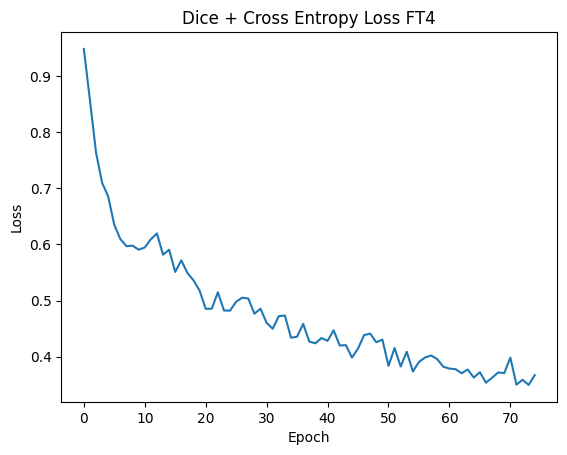

In [ ]:
# THIS IS ALL PARAMETERS 75 epochs

plt.plot(losses)
plt.title('Dice + Cross Entropy Loss FT4')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()
plt.savefig(join("/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal", 'train_loss.png'))
plt.close()

In [ ]:
#%% compare the segmentation results between the original SAM model and the fine-tuned model
# load the original SAM model
ori_sam_model = sam_model_registry[model_type](checkpoint=checkpoint).to(device)
ori_sam_predictor = SamPredictor(ori_sam_model)
npz_ts_path = '/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/data/Npz_files/CT_Abd-Adrenal/test'
test_npzs = sorted(os.listdir(npz_ts_path))

# random select a test case
npz_idx = np.random.randint(0, len(test_npzs))
npz = np.load(join(npz_ts_path, test_npzs[npz_idx]))
imgs = npz['imgs']
gts = npz['gts']

def get_bbox_from_mask(mask):
    '''Returns a bounding box from a mask'''
    y_indices, x_indices = np.where(mask > 0)
    x_min, x_max = np.min(x_indices), np.max(x_indices)
    y_min, y_max = np.min(y_indices), np.max(y_indices)
    # add perturbation to bounding box coordinates
    H, W = mask.shape
    x_min = max(0, x_min - np.random.randint(0, 20))
    x_max = min(W, x_max + np.random.randint(0, 20))
    y_min = max(0, y_min - np.random.randint(0, 20))
    y_max = min(H, y_max + np.random.randint(0, 20))

    return np.array([x_min, y_min, x_max, y_max])

ori_sam_segs = []
medsam_segs = []
bboxes = []
for img, gt in zip(imgs, gts):

    bbox = get_bbox_from_mask(gt)

    bboxes.append(bbox)
    # predict the segmentation mask using the original SAM model
    ori_sam_predictor.set_image(img)
    ori_sam_seg, _, _ = ori_sam_predictor.predict(point_coords=None, box=bbox, multimask_output=False)
    ori_sam_segs.append(ori_sam_seg[0])

    # predict the segmentation mask using the fine-tuned model
    H, W = img.shape[:2]
    resize_img = sam_trans.apply_image(img)
    resize_img_tensor = torch.as_tensor(resize_img.transpose(2, 0, 1)).to(device)
    input_image = sam_model.preprocess(resize_img_tensor[None,:,:,:]) # (1, 3, 1024, 1024)
    with torch.no_grad():
        image_embedding = sam_model.image_encoder(input_image.to(device)) # (1, 256, 64, 64)
        # convert box to 1024x1024 grid
        bbox = sam_trans.apply_boxes(bbox, (H, W))
        box_torch = torch.as_tensor(bbox, dtype=torch.float, device=device)
        if len(box_torch.shape) == 2:
            box_torch = box_torch[:, None, :] # (B, 1, 4)

        sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
            points=None,
            boxes=box_torch,
            masks=None,
        )
        medsam_seg_prob, _ = sam_model.mask_decoder(
            image_embeddings=image_embedding.to(device), # (B, 256, 64, 64)
            image_pe=sam_model.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
            sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
            dense_prompt_embeddings=dense_embeddings, # (B, 256, 64, 64)
            multimask_output=False,
            )
        medsam_seg_prob = torch.sigmoid(medsam_seg_prob)
        # convert soft mask to hard mask
        medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
        medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)
        medsam_segs.append(medsam_seg)

In [ ]:
#%% compute the DSC score
ori_sam_segs = np.stack(ori_sam_segs, axis=0)
medsam_segs = np.stack(medsam_segs, axis=0)
ori_sam_dsc = compute_dice_coefficient(gts>0, ori_sam_segs>0)
medsam_dsc = compute_dice_coefficient(gts>0, medsam_segs>0)
print('Original SAM DSC: {:.4f}'.format(ori_sam_dsc), 'MedSAM DSC: {:.4f}'.format(medsam_dsc))

Original SAM DSC: 0.1986 MedSAM DSC: 0.1094


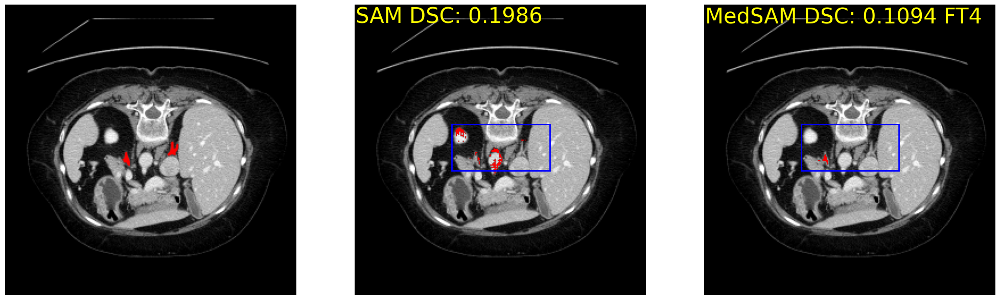

In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        # color = np.array([251/255, 252/255, 30/255, 0.6])
        color = np.array([1.0, 0.0, 0.0, 1.0], dtype=np.float32)
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='blue', facecolor=(0,0,0,0), lw=2))


img_id = int(imgs.shape[0]/2)  # np.random.randint(imgs.shape[0])
_, axs = plt.subplots(1, 3, figsize=(25, 25))
axs[0].imshow(imgs[img_id])
show_mask(gts[img_id], axs[0])
# show_box(box_np[img_id], axs[0])
# axs[0].set_title('Mask with Tuned Model', fontsize=20)
axs[0].axis('off')

axs[1].imshow(imgs[img_id])
show_mask(ori_sam_segs[img_id], axs[1])
show_box(bboxes[img_id], axs[1])
# add text to image to show dice score
axs[1].text(0.5, 0.5, 'SAM DSC: {:.4f}'.format(ori_sam_dsc), fontsize=30, horizontalalignment='left', verticalalignment='top', color='yellow')
# axs[1].set_title('Mask with Untuned Model', fontsize=20)
axs[1].axis('off')

axs[2].imshow(imgs[img_id])
show_mask(medsam_segs[img_id], axs[2])
show_box(bboxes[img_id], axs[2])
# add text to image to show dice score
axs[2].text(0.5, 0.5, 'MedSAM DSC: {:.4f} FT4'.format(medsam_dsc), fontsize=30, horizontalalignment='left', verticalalignment='top', color='yellow')
# axs[2].set_title('Ground Truth', fontsize=20)
axs[2].axis('off')
plt.show()
plt.subplots_adjust(wspace=0.01, hspace=0)
# save plot
plt.close()

# ALL PARAMS EPOCHS :

In [ ]:
sam_model = sam_model_registry[model_type](checkpoint=checkpoint).to(device)
sam_model.train()

optimizer = torch.optim.Adam(sam_model.parameters(), lr=1e-4, weight_decay=0)
seg_loss = monai.losses.DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')

num_epochs = 175
losses = []
best_loss = 1e10
train_dataset = NpzDataset(npz_tr_path)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

for epoch in range(num_epochs):
    epoch_loss = 0
    # train
    for step, (img,image_embedding, gt2D, boxes) in enumerate(tqdm(train_dataloader)):
        # do not compute gradients for image encoder and prompt encoder
        # with torch.no_grad():
            # convert box to 1024x1024 grid
            box_np = boxes.numpy()
            sam_trans = ResizeLongestSide(sam_model.image_encoder.img_size)
            box = sam_trans.apply_boxes(box_np, (gt2D.shape[-2], gt2D.shape[-1]))
            box_torch = torch.as_tensor(box, dtype=torch.float, device=device)
            if len(box_torch.shape) == 2:
                box_torch = box_torch[:, None, :] # (B, 1, 4)
            # get prompt embeddings

            # plt.imshow(img.detach().numpy()[0])
            # plt.show()
            # plot_bounding_box(boxes.detach().numpy()[0],img.detach().numpy()[0])
            # plt.imshow(gt2D[0][0],cmap = 'gray')
            # plt.show()

            sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                points=None,
                boxes=box_torch,
                masks=None,
            )
        # print(image_embedding.shape)
        # print(gt2D.shape)
        # print(boxes.shape)
        # print(sparse_embeddings.shape)
        # print(dense_embeddings.shape)
        # predicted masks
            mask_predictions, _ = sam_model.mask_decoder(
                image_embeddings=image_embedding.to(device), # (B, 256, 64, 64)
                image_pe=sam_model.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
                sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
                dense_prompt_embeddings=dense_embeddings, # (B, 256, 64, 64)
                multimask_output=False,
              )
        # plt.imshow(mask_predictions.detach().cpu().numpy()[0][0],cmap = "gray")
        # break
            loss = seg_loss(mask_predictions, gt2D.to(device))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()


        # lr_scheduler.step(loss)


            epoch_loss += loss.item()
    # break
    epoch_loss /= step
    losses.append(epoch_loss)
    print(f'EPOCH: {epoch}, Loss: {epoch_loss}')
    # save the latest model checkpoint
    torch.save(sam_model.state_dict(), join("/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal_All_params_175_epochs", 'sam_model_latest.pth'))
    # save the best model
    if epoch_loss < best_loss:
        best_loss = epoch_loss
        torch.save(sam_model.state_dict(), join("/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal_All_params_175_epochs", 'sam_model_best.pth'))

self.img_embeddings.shape=(433, 256, 64, 64), self.ori_gts.shape=(433, 256, 256)


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 0, Loss: 0.9207474222550025


100%|██████████| 14/14 [00:06<00:00,  2.27it/s]


EPOCH: 1, Loss: 0.7239047288894653


100%|██████████| 14/14 [00:05<00:00,  2.35it/s]


EPOCH: 2, Loss: 0.6526095271110535


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 3, Loss: 0.5786466254637792


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 4, Loss: 0.5433144661096426


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 5, Loss: 0.5527389989449427


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 6, Loss: 0.5165158418508676


100%|██████████| 14/14 [00:06<00:00,  2.21it/s]


EPOCH: 7, Loss: 0.5253328222494859


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 8, Loss: 0.4912146536203531


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 9, Loss: 0.48317222870313203


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 10, Loss: 0.4964195512808286


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 11, Loss: 0.4825445574063521


100%|██████████| 14/14 [00:06<00:00,  2.27it/s]


EPOCH: 12, Loss: 0.4819628894329071


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 13, Loss: 0.46471944680580723


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 14, Loss: 0.45947182178497314


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 15, Loss: 0.44176390767097473


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 16, Loss: 0.4703331452149611


100%|██████████| 14/14 [00:06<00:00,  2.22it/s]


EPOCH: 17, Loss: 0.4199362809841449


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 18, Loss: 0.4050828837431394


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 19, Loss: 0.39939892292022705


100%|██████████| 14/14 [00:06<00:00,  2.29it/s]


EPOCH: 20, Loss: 0.38888923021463245


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 21, Loss: 0.39124926924705505


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 22, Loss: 0.39019310015898484


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 23, Loss: 0.39163655271896947


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 24, Loss: 0.42672571310630214


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 25, Loss: 0.41191932329764736


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 26, Loss: 0.4789422635848706


100%|██████████| 14/14 [00:06<00:00,  2.33it/s]


EPOCH: 27, Loss: 0.40829907243068403


100%|██████████| 14/14 [00:05<00:00,  2.43it/s]


EPOCH: 28, Loss: 0.4846387299207541


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 29, Loss: 0.4709051870382749


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 30, Loss: 0.429912078839082


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 31, Loss: 0.3855666976708632


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 32, Loss: 0.38085520496735203


100%|██████████| 14/14 [00:05<00:00,  2.35it/s]


EPOCH: 33, Loss: 0.3768709691671225


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 34, Loss: 0.42542120814323425


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 35, Loss: 0.4018614487006114


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 36, Loss: 0.3692541764332698


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 37, Loss: 0.3630764874128195


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 38, Loss: 0.35996541380882263


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 39, Loss: 0.3499258527388939


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 40, Loss: 0.3582800179719925


100%|██████████| 14/14 [00:06<00:00,  2.25it/s]


EPOCH: 41, Loss: 0.33547313855244565


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 42, Loss: 0.33257127495912403


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 43, Loss: 0.33391578037005204


100%|██████████| 14/14 [00:05<00:00,  2.33it/s]


EPOCH: 44, Loss: 0.31201040744781494


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 45, Loss: 0.3071191654755519


100%|██████████| 14/14 [00:06<00:00,  2.29it/s]


EPOCH: 46, Loss: 0.3077900123137694


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 47, Loss: 0.29047272411676556


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 48, Loss: 0.2865035728766368


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 49, Loss: 0.302975574365029


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 50, Loss: 0.2809747365804819


100%|██████████| 14/14 [00:06<00:00,  2.33it/s]


EPOCH: 51, Loss: 0.28581160192306226


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 52, Loss: 0.27565363622628725


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 53, Loss: 0.2870069421254672


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 54, Loss: 0.2966881509010608


100%|██████████| 14/14 [00:05<00:00,  2.42it/s]


EPOCH: 55, Loss: 0.31609682394908023


100%|██████████| 14/14 [00:06<00:00,  2.33it/s]


EPOCH: 56, Loss: 0.3053869754076004


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 57, Loss: 0.28678171222026533


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 58, Loss: 0.3241338844482715


100%|██████████| 14/14 [00:05<00:00,  2.42it/s]


EPOCH: 59, Loss: 0.3006770679583916


100%|██████████| 14/14 [00:06<00:00,  2.26it/s]


EPOCH: 60, Loss: 0.28964106967815983


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 61, Loss: 0.28174145978230697


100%|██████████| 14/14 [00:06<00:00,  2.33it/s]


EPOCH: 62, Loss: 0.26470193610741544


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 63, Loss: 0.2947959258006169


100%|██████████| 14/14 [00:05<00:00,  2.42it/s]


EPOCH: 64, Loss: 0.2781484127044678


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 65, Loss: 0.25430186092853546


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 66, Loss: 0.23877223179890558


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 67, Loss: 0.23346926959661338


100%|██████████| 14/14 [00:06<00:00,  2.26it/s]


EPOCH: 68, Loss: 0.23736813091314757


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 69, Loss: 0.23075479956773612


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 70, Loss: 0.2506649081523602


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 71, Loss: 0.2454040956038695


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 72, Loss: 0.2419978380203247


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 73, Loss: 0.2203840808226512


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 74, Loss: 0.21589957406887642


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 75, Loss: 0.22274810305008522


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 76, Loss: 0.2878766300586554


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 77, Loss: 0.2884934968673266


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 78, Loss: 0.25135854803598845


100%|██████████| 14/14 [00:05<00:00,  2.42it/s]


EPOCH: 79, Loss: 0.2531244777716123


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 80, Loss: 0.2549536033318593


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 81, Loss: 0.23058693569440109


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 82, Loss: 0.34516012783233935


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 83, Loss: 0.2979297305528934


100%|██████████| 14/14 [00:06<00:00,  2.26it/s]


EPOCH: 84, Loss: 0.2585578171106485


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 85, Loss: 0.2423339726833197


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 86, Loss: 0.2709711893246724


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 87, Loss: 0.3168178854080347


100%|██████████| 14/14 [00:06<00:00,  2.29it/s]


EPOCH: 88, Loss: 0.29589232114645153


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 89, Loss: 0.2551648891889132


100%|██████████| 14/14 [00:06<00:00,  2.18it/s]


EPOCH: 90, Loss: 0.24362107882132897


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 91, Loss: 0.24051530544574445


100%|██████████| 14/14 [00:06<00:00,  2.27it/s]


EPOCH: 92, Loss: 0.22601661086082458


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 93, Loss: 0.22280039351720077


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 94, Loss: 0.23099258427436536


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 95, Loss: 0.2925438227561804


100%|██████████| 14/14 [00:05<00:00,  2.35it/s]


EPOCH: 96, Loss: 0.2872629440747775


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 97, Loss: 0.26793617755174637


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 98, Loss: 0.278302034506431


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 99, Loss: 0.3093989399763254


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 100, Loss: 0.27783418733340043


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 101, Loss: 0.2515351428435399


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 102, Loss: 0.25684292958332944


100%|██████████| 14/14 [00:05<00:00,  2.35it/s]


EPOCH: 103, Loss: 0.22268432264144605


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 104, Loss: 0.21334659938628858


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 105, Loss: 0.3909714244879209


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 106, Loss: 0.4307172435980577


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 107, Loss: 0.2922532306267665


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 108, Loss: 0.2856581440338722


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 109, Loss: 0.2740188493178441


100%|██████████| 14/14 [00:06<00:00,  2.33it/s]


EPOCH: 110, Loss: 0.2808661013841629


100%|██████████| 14/14 [00:05<00:00,  2.42it/s]


EPOCH: 111, Loss: 0.2559598432137416


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 112, Loss: 0.2246309988773786


100%|██████████| 14/14 [00:05<00:00,  2.42it/s]


EPOCH: 113, Loss: 0.23370065024265876


100%|██████████| 14/14 [00:06<00:00,  2.33it/s]


EPOCH: 114, Loss: 0.3048207633770429


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 115, Loss: 0.27378985629631925


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 116, Loss: 0.23723409267572257


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 117, Loss: 0.21301471040799067


100%|██████████| 14/14 [00:06<00:00,  2.29it/s]


EPOCH: 118, Loss: 0.2091147372355828


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 119, Loss: 0.20431866897986486


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 120, Loss: 0.18238491049179664


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 121, Loss: 0.18454605512894118


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 122, Loss: 0.18162518854324633


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 123, Loss: 0.23588405893399164


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 124, Loss: 0.22425168638045972


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 125, Loss: 0.3014931713159268


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 126, Loss: 0.28340968718895543


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 127, Loss: 0.23795900207299453


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 128, Loss: 0.19662002875254705


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 129, Loss: 0.18213957433517164


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 130, Loss: 0.17536818637297705


100%|██████████| 14/14 [00:05<00:00,  2.35it/s]


EPOCH: 131, Loss: 0.1716826781630516


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 132, Loss: 0.1630557649410688


100%|██████████| 14/14 [00:06<00:00,  2.29it/s]


EPOCH: 133, Loss: 0.17652771392693886


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 134, Loss: 0.18806931089896423


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 135, Loss: 0.18514678340691787


100%|██████████| 14/14 [00:06<00:00,  2.33it/s]


EPOCH: 136, Loss: 0.15588566317008093


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 137, Loss: 0.1521736463675132


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 138, Loss: 0.15500949380489495


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 139, Loss: 0.1478727305164704


100%|██████████| 14/14 [00:06<00:00,  2.30it/s]


EPOCH: 140, Loss: 0.14913399746784797


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 141, Loss: 0.14087108293404946


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 142, Loss: 0.15716935522281206


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 143, Loss: 0.2000297479904615


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 144, Loss: 0.17980275818934807


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 145, Loss: 0.15690586486688027


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 146, Loss: 0.14649991060678774


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 147, Loss: 0.14522985139718422


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 148, Loss: 0.20758011364019835


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 149, Loss: 0.16984507556145007


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 150, Loss: 0.15925379326710334


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 151, Loss: 0.14149337376539523


100%|██████████| 14/14 [00:05<00:00,  2.41it/s]


EPOCH: 152, Loss: 0.1424448495874038


100%|██████████| 14/14 [00:06<00:00,  2.32it/s]


EPOCH: 153, Loss: 0.13714278718599907


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 154, Loss: 0.1543522345331999


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 155, Loss: 0.17451741718328917


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 156, Loss: 0.1474517142543426


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 157, Loss: 0.13748866720841482


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 158, Loss: 0.13124289363622665


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 159, Loss: 0.13196240709378168


100%|██████████| 14/14 [00:06<00:00,  2.27it/s]


EPOCH: 160, Loss: 0.12638679719888246


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 161, Loss: 0.12431927770376205


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 162, Loss: 0.12735735338467818


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 163, Loss: 0.12325904203148988


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 164, Loss: 0.12575065459196383


100%|██████████| 14/14 [00:05<00:00,  2.35it/s]


EPOCH: 165, Loss: 0.15091828543406266


100%|██████████| 14/14 [00:05<00:00,  2.38it/s]


EPOCH: 166, Loss: 0.17158357741741034


100%|██████████| 14/14 [00:05<00:00,  2.37it/s]


EPOCH: 167, Loss: 0.1391628421843052


100%|██████████| 14/14 [00:05<00:00,  2.36it/s]


EPOCH: 168, Loss: 0.1274362366933089


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 169, Loss: 0.12016656479010215


100%|██████████| 14/14 [00:06<00:00,  2.31it/s]


EPOCH: 170, Loss: 0.2205738018338497


100%|██████████| 14/14 [00:05<00:00,  2.40it/s]


EPOCH: 171, Loss: 0.2311642445050753


100%|██████████| 14/14 [00:05<00:00,  2.34it/s]


EPOCH: 172, Loss: 0.20882155001163483


100%|██████████| 14/14 [00:05<00:00,  2.39it/s]


EPOCH: 173, Loss: 0.20239591140013474


100%|██████████| 14/14 [00:05<00:00,  2.35it/s]


EPOCH: 174, Loss: 0.20877229823515966


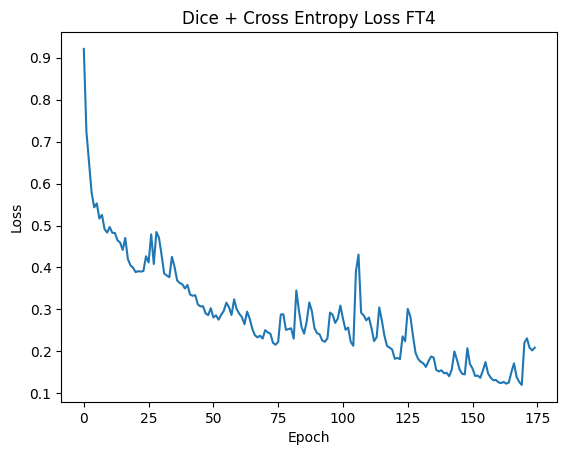

In [ ]:
plt.plot(losses)
plt.title('Dice + Cross Entropy Loss FT4')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()
# plt.savefig(join("/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal", 'train_loss.png'))
plt.close()

In [ ]:
#%% compare the segmentation results between the original SAM model and the fine-tuned model
# load the original SAM model
ori_sam_model = sam_model_registry[model_type](checkpoint=checkpoint).to(device)
ori_sam_predictor = SamPredictor(ori_sam_model)
npz_ts_path = '/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/data/Npz_files/CT_Abd-Adrenal/test'
test_npzs = sorted(os.listdir(npz_ts_path))

# random select a test case
npz_idx = np.random.randint(0, len(test_npzs))
npz = np.load(join(npz_ts_path, test_npzs[npz_idx]))
imgs = npz['imgs']
gts = npz['gts']

def get_bbox_from_mask(mask):
    '''Returns a bounding box from a mask'''
    y_indices, x_indices = np.where(mask > 0)
    x_min, x_max = np.min(x_indices), np.max(x_indices)
    y_min, y_max = np.min(y_indices), np.max(y_indices)
    # add perturbation to bounding box coordinates
    H, W = mask.shape
    x_min = max(0, x_min - np.random.randint(0, 20))
    x_max = min(W, x_max + np.random.randint(0, 20))
    y_min = max(0, y_min - np.random.randint(0, 20))
    y_max = min(H, y_max + np.random.randint(0, 20))

    return np.array([x_min, y_min, x_max, y_max])

ori_sam_segs = []
medsam_segs = []
bboxes = []
for img, gt in zip(imgs, gts):

    bbox = get_bbox_from_mask(gt)

    bboxes.append(bbox)
    # predict the segmentation mask using the original SAM model
    ori_sam_predictor.set_image(img)
    ori_sam_seg, _, _ = ori_sam_predictor.predict(point_coords=None, box=bbox, multimask_output=False)
    ori_sam_segs.append(ori_sam_seg[0])

    # predict the segmentation mask using the fine-tuned model
    H, W = img.shape[:2]
    resize_img = sam_trans.apply_image(img)
    resize_img_tensor = torch.as_tensor(resize_img.transpose(2, 0, 1)).to(device)
    input_image = sam_model.preprocess(resize_img_tensor[None,:,:,:]) # (1, 3, 1024, 1024)
    with torch.no_grad():
        image_embedding = sam_model.image_encoder(input_image.to(device)) # (1, 256, 64, 64)
        # convert box to 1024x1024 grid
        bbox = sam_trans.apply_boxes(bbox, (H, W))
        box_torch = torch.as_tensor(bbox, dtype=torch.float, device=device)
        if len(box_torch.shape) == 2:
            box_torch = box_torch[:, None, :] # (B, 1, 4)

        sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
            points=None,
            boxes=box_torch,
            masks=None,
        )
        medsam_seg_prob, _ = sam_model.mask_decoder(
            image_embeddings=image_embedding.to(device), # (B, 256, 64, 64)
            image_pe=sam_model.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
            sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
            dense_prompt_embeddings=dense_embeddings, # (B, 256, 64, 64)
            multimask_output=False,
            )
        medsam_seg_prob = torch.sigmoid(medsam_seg_prob)
        # convert soft mask to hard mask
        medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
        medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)
        medsam_segs.append(medsam_seg)

In [ ]:
#%% compute the DSC score
ori_sam_segs = np.stack(ori_sam_segs, axis=0)
medsam_segs = np.stack(medsam_segs, axis=0)
ori_sam_dsc = compute_dice_coefficient(gts>0, ori_sam_segs>0)
medsam_dsc = compute_dice_coefficient(gts>0, medsam_segs>0)
print('Original SAM DSC: {:.4f}'.format(ori_sam_dsc), 'MedSAM DSC: {:.4f}'.format(medsam_dsc))

Original SAM DSC: 0.2304 MedSAM DSC: 0.0824


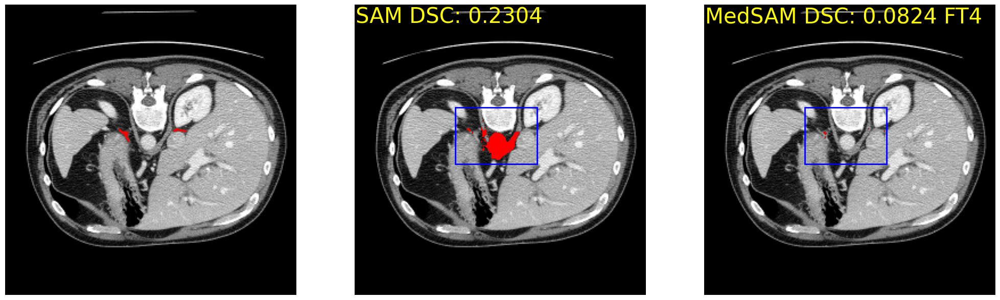

In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        # color = np.array([251/255, 252/255, 30/255, 0.6])
        color = np.array([1.0, 0.0, 0.0, 1.0], dtype=np.float32)
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='blue', facecolor=(0,0,0,0), lw=2))


img_id = int(imgs.shape[0]/2)  # np.random.randint(imgs.shape[0])
_, axs = plt.subplots(1, 3, figsize=(25, 25))
axs[0].imshow(imgs[img_id])
show_mask(gts[img_id], axs[0])
# show_box(box_np[img_id], axs[0])
# axs[0].set_title('Mask with Tuned Model', fontsize=20)
axs[0].axis('off')

axs[1].imshow(imgs[img_id])
show_mask(ori_sam_segs[img_id], axs[1])
show_box(bboxes[img_id], axs[1])
# add text to image to show dice score
axs[1].text(0.5, 0.5, 'SAM DSC: {:.4f}'.format(ori_sam_dsc), fontsize=30, horizontalalignment='left', verticalalignment='top', color='yellow')
# axs[1].set_title('Mask with Untuned Model', fontsize=20)
axs[1].axis('off')

axs[2].imshow(imgs[img_id])
show_mask(medsam_segs[img_id], axs[2])
show_box(bboxes[img_id], axs[2])
# add text to image to show dice score
axs[2].text(0.5, 0.5, 'MedSAM DSC: {:.4f} FT4'.format(medsam_dsc), fontsize=30, horizontalalignment='left', verticalalignment='top', color='yellow')
# axs[2].set_title('Ground Truth', fontsize=20)
axs[2].axis('off')
plt.show()
plt.subplots_adjust(wspace=0.01, hspace=0)
# save plot
plt.close()

# DICE SCORE CALCULATIONS : small box

In [ ]:
pip install git+https://github.com/facebookresearch/segment-anything.git

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
def dice_score_percentage(predicted_mask, target_mask):
    intersection = (predicted_mask * target_mask).sum()
    union = predicted_mask.sum() + target_mask.sum()
    dice = 2 * intersection / (union + 1e-8)  # Adding a small epsilon to avoid division by zero
    dice_percentage = dice * 100.0
    return dice_percentage

In [ ]:
def window_image(img,rescale=True):
    # img = (img*slope +intercept) #for translation adjustments given in the dicom file.
    window_center = 50
    window_width = 350

    img_min = window_center - window_width//2 #minimum HU level
    img_max = window_center + window_width//2 #maximum HU level
    img[img<img_min] = img_min #set img_min for all HU levels less than minimum HU level
    img[img>img_max] = img_max #set img_max for all HU levels higher than maximum HU level
    if rescale:
        img = (img - img_min) / (img_max - img_min)*255.0
    return img

def plot_bounding_box(bbox, image):
    fig, ax = plt.subplots()
    ax.imshow(image)
    x_min, y_min, x_max, y_max = bbox
    width = x_max - x_min
    height = y_max - y_min
    rect = plt.Rectangle((x_min, y_min), width, height,
                         linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    # Set the aspect ratio of the axis to 'equal'
    ax.set_aspect('equal')
    plt.show()

def get_bbox_from_mask(mask):
    '''Returns a bounding box from a mask'''
    y_indices, x_indices = np.where(mask > 0)
    x_min, x_max = np.min(x_indices), np.max(x_indices)
    y_min, y_max = np.min(y_indices), np.max(y_indices)
    # add perturbation to bounding box coordinates
    H, W = mask.shape
    x_min = max(0, x_min - np.random.randint(0, 20))
    x_max = min(W, x_max + np.random.randint(0, 20))
    y_min = max(0, y_min - np.random.randint(0, 20))
    y_max = min(H, y_max + np.random.randint(0, 20))

    return np.array([x_min, y_min, x_max, y_max])

In [ ]:
# Loading medsam
checkpoint = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/SAM/sam_vit_b_01ec64 (1).pth"
medsam = sam_model_registry["vit_b"](checkpoint=checkpoint).to(device)

In [ ]:
load1 = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal/sam_model_best,E:200.pth"

load2 = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/Training_July/Medsam_Diff_training_dicts/CT_Abd-Adrenal/sam_model_best,E:200.pth"

#decoder only ,full box , 200 Epochs
load3 = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/782_images_Small_box_No_val/Medsam_Diff_training_dicts/Full_Box_200E"
medsam.load_state_dict(torch.load(load3, map_location=device))
medsam.eval()

In [ ]:
  # TEST DATASET CREATION

test_set_path = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/Training_July/data_FLARE22_more_patients/Npz_files/CT_Abd-Adrenal/test"

test_npz_files = os.listdir(test_set_path)

total_images_for_testing = 0

test_images = []
test_labels = []

for file in test_npz_files:
    file_path = join(test_set_path,file)
    test = np.load(file_path)

    n = test['imgs'].shape[0]

    for i in range(n):
        img = test['imgs'][i]
        label = test['gts'][i]

        test_images.append(img)
        test_labels.append(label)

    total_images_for_testing += test['imgs'].shape[0]

print(total_images_for_testing)
print(len(test_images))
# 129 images for testing

195
195


In [ ]:
# VISUALISATION OF THE TEST DATASET

for i in range(len(test_images)):
    img = test_images[i]
    gt = test_labels[i]

    fig,ax = plt.subplots(1,2)

    ax[0].imshow(img,cmap = 'gray')
    ax[0].set_title(f"CT_scan_{i}")
    ax[1].imshow(gt,cmap = 'gray')
    ax[1].set_title(f"Label_{i}")
    plt.show()
    plt.tight_layout()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#%% compare the segmentation results between the original SAM model and the fine-tuned model
# load the original SAM model
# ori_sam_model = sam_model_registry[model_type](checkpoint=checkpoint).to(device)
# ori_sam_predictor = SamPredictor(ori_sam_model)

dice = 0
count = 0

for i in range(len(test_images)):


    fig,ax = plt.subplots(1,3)

    # bboxes.append(bbox)
    img = test_images[i]
    gt = test_labels[i]


    bbox = get_bbox_from_mask(gt)
    # bbox = np.array([65,80,180,140])
    # plot_bounding_box(bbox,img)

    # predict the segmentation mask using the original SAM model
    # ori_sam_predictor.set_image(img)
    # ori_sam_seg, _, _ = ori_sam_predictor.predict(point_coords=None, box=bbox, multimask_output=False)
    # ori_sam_segs.append(ori_sam_seg[0])

    # predict the segmentation mask using the fine-tuned model

    ax[0].imshow(img,cmap = 'gray')
    ax[0].set_title(f"CT_Scan_{i}")

    ax[1].imshow(gt,cmap = 'gray')
    ax[1].set_title(f"Label_{i}")

    H, W = img.shape[:2]

    sam_trans = ResizeLongestSide(medsam.image_encoder.img_size)

    resize_img = sam_trans.apply_image(img)

    resize_img_tensor = torch.as_tensor(resize_img.transpose(2, 0, 1)).to(device)

    input_image = medsam.preprocess(resize_img_tensor[None,:,:,:]) # (1, 3, 1024, 1024)

    with torch.no_grad():
        image_embedding = medsam.image_encoder(input_image.to(device)) # (1, 256, 64, 64)
        # convert box to 1024x1024 grid
        bbox = sam_trans.apply_boxes(bbox, (H, W))
        box_torch = torch.as_tensor(bbox, dtype=torch.float, device=device)
        if len(box_torch.shape) == 2:
            box_torch = box_torch[:, None, :] # (B, 1, 4)

        sparse_embeddings, dense_embeddings = medsam.prompt_encoder(
            points=None,
            boxes=box_torch,
            masks=None,
        )
        medsam_seg_prob, _ = medsam.mask_decoder(
            image_embeddings=image_embedding.to(device), # (B, 256, 64, 64)
            image_pe=medsam.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
            sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
            dense_prompt_embeddings=dense_embeddings, # (B, 256, 64, 64)
            multimask_output=False,
        )
        medsam_seg_prob = torch.sigmoid(medsam_seg_prob)
        # convert soft mask to hard mask
        medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
        medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)

        ax[2].imshow(medsam_seg,cmap = 'gray')
        ax[2].set_title(f"Medsam_seg_{i}")

        plt.show()
        plt.tight_layout()

        print()

        dice_set = dice_score_percentage(medsam_seg,gt)
        dice += dice_set
        print("DICE SCORE FOR THIS SET : ",dice_set)
        count+=1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(dice)
print(count)

print("MedSAM DSC : ",dice/count)

2830.861377684465
195
MedSAM DSC :  14.517237834279307


# DICE SCORE CALCULATIONS : FULL BOX



In [ ]:
pip install git+https://github.com/facebookresearch/segment-anything.git

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
def dice_score_percentage(predicted_mask, target_mask):
    intersection = (predicted_mask * target_mask).sum()
    union = predicted_mask.sum() + target_mask.sum()
    dice = 2 * intersection / (union + 1e-8)  # Adding a small epsilon to avoid division by zero
    dice_percentage = dice * 100.0
    return dice_percentage

In [ ]:
def window_image(img,rescale=True):
    # img = (img*slope +intercept) #for translation adjustments given in the dicom file.
    window_center = 50
    window_width = 350

    img_min = window_center - window_width//2 #minimum HU level
    img_max = window_center + window_width//2 #maximum HU level
    img[img<img_min] = img_min #set img_min for all HU levels less than minimum HU level
    img[img>img_max] = img_max #set img_max for all HU levels higher than maximum HU level
    if rescale:
        img = (img - img_min) / (img_max - img_min)*255.0
    return img

def plot_bounding_box(bbox, image):
    fig, ax = plt.subplots()
    ax.imshow(image)
    x_min, y_min, x_max, y_max = bbox
    width = x_max - x_min
    height = y_max - y_min
    rect = plt.Rectangle((x_min, y_min), width, height,
                         linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    # Set the aspect ratio of the axis to 'equal'
    ax.set_aspect('equal')
    plt.show()

def get_bbox_from_mask(mask):
    '''Returns a bounding box from a mask'''
    y_indices, x_indices = np.where(mask > 0)
    x_min, x_max = np.min(x_indices), np.max(x_indices)
    y_min, y_max = np.min(y_indices), np.max(y_indices)
    # add perturbation to bounding box coordinates
    H, W = mask.shape
    x_min = max(0, x_min - np.random.randint(0, 20))
    x_max = min(W, x_max + np.random.randint(0, 20))
    y_min = max(0, y_min - np.random.randint(0, 20))
    y_max = min(H, y_max + np.random.randint(0, 20))

    return np.array([x_min, y_min, x_max, y_max])

In [ ]:
# Loading medsam
checkpoint = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/SAM/sam_vit_b_01ec64 (1).pth"
medsam = sam_model_registry["vit_b"](checkpoint=checkpoint).to(device)

In [ ]:
load1 = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/CT_Abd-Adrenal/sam_model_best,E:200.pth"

load2 = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/Training_July/Medsam_Diff_training_dicts/CT_Abd-Adrenal/sam_model_best,E:200.pth"

#decoder only ,full box , 200 Epochs
load3 = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/782_images_Small_box_No_val/Medsam_Diff_training_dicts/Full_Box_200E/sam_model_best,E:200.pth"
medsam.load_state_dict(torch.load(load3, map_location=device))
medsam.eval()

In [ ]:
  # TEST DATASET CREATION

test_set_path = "/content/drive/MyDrive/Colab Notebooks/MedSAM-Adrenal/782_images_Small_box_No_val/data_FLARE22_more_patients/Npz_files/CT_Abd-Adrenal/test"

test_npz_files = os.listdir(test_set_path)

total_images_for_testing = 0

test_images = []
test_labels = []

for file in test_npz_files:
    file_path = join(test_set_path,file)
    test = np.load(file_path)

    n = test['imgs'].shape[0]

    for i in range(n):
        img = test['imgs'][i]
        label = test['gts'][i]

        test_images.append(img)
        test_labels.append(label)

    total_images_for_testing += test['imgs'].shape[0]

print(total_images_for_testing)
print(len(test_images))
# 129 images for testing

195
195


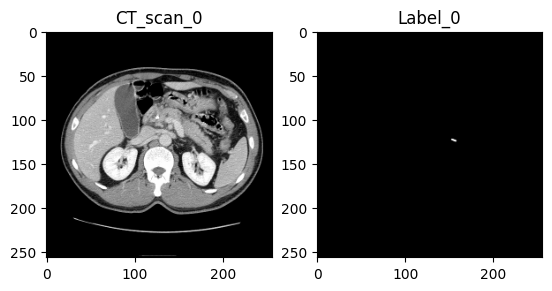

<Figure size 640x480 with 0 Axes>

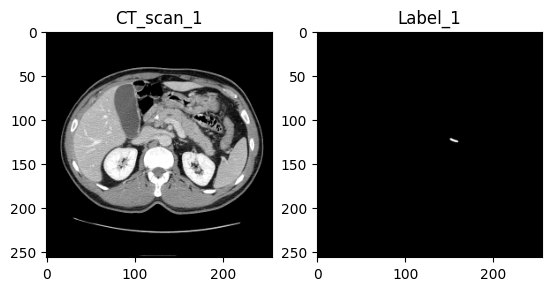

<Figure size 640x480 with 0 Axes>

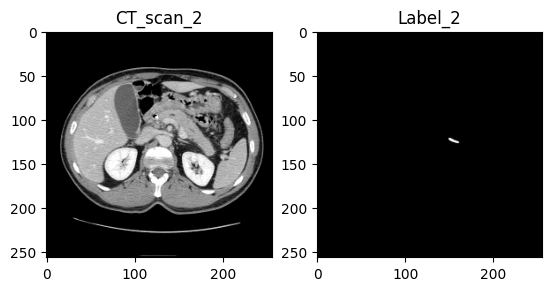

<Figure size 640x480 with 0 Axes>

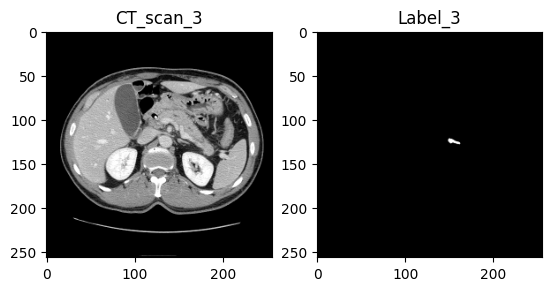

<Figure size 640x480 with 0 Axes>

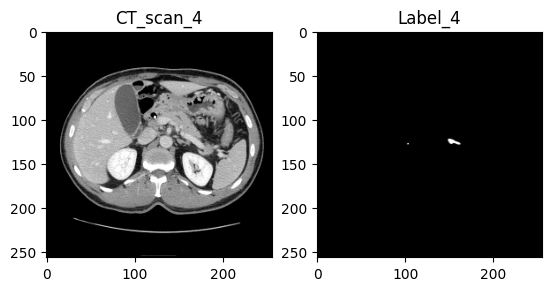

<Figure size 640x480 with 0 Axes>

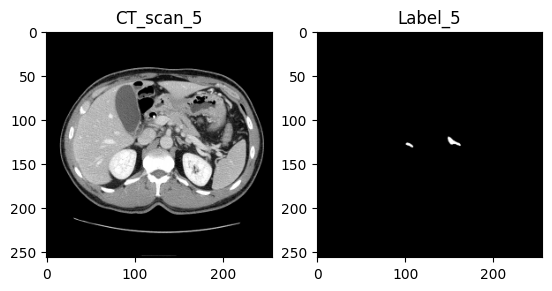

<Figure size 640x480 with 0 Axes>

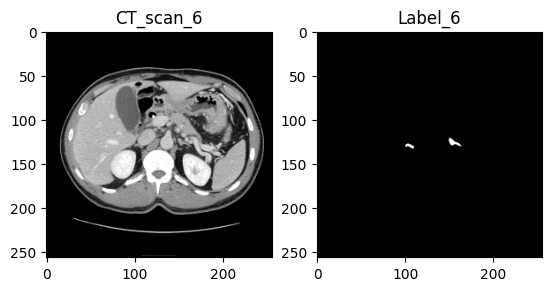

<Figure size 640x480 with 0 Axes>

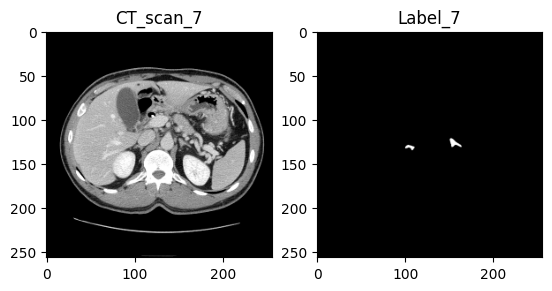

<Figure size 640x480 with 0 Axes>

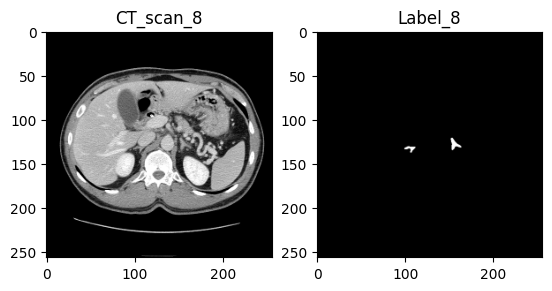

<Figure size 640x480 with 0 Axes>

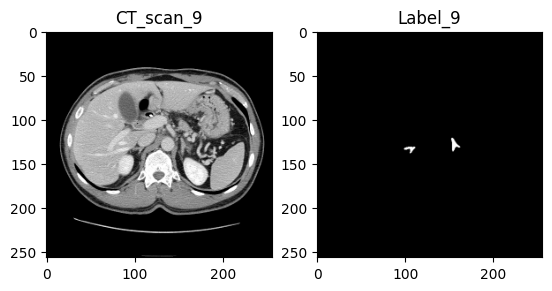

<Figure size 640x480 with 0 Axes>

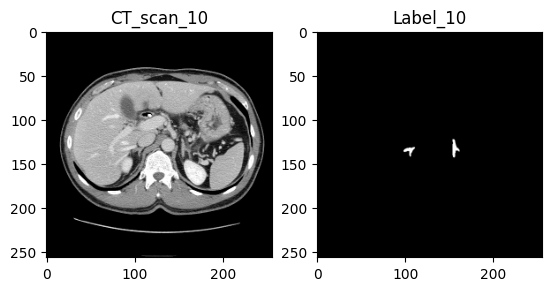

<Figure size 640x480 with 0 Axes>

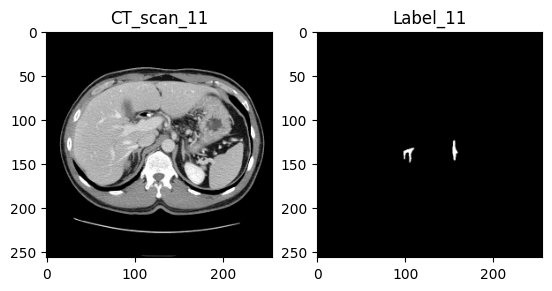

<Figure size 640x480 with 0 Axes>

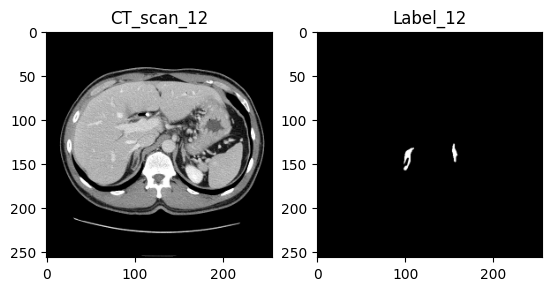

<Figure size 640x480 with 0 Axes>

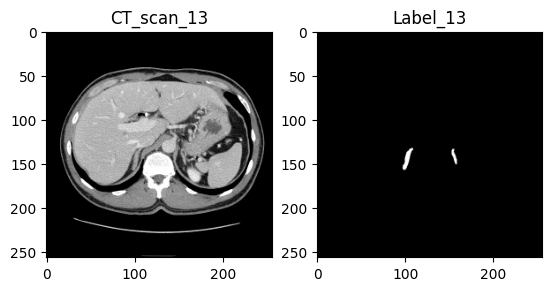

<Figure size 640x480 with 0 Axes>

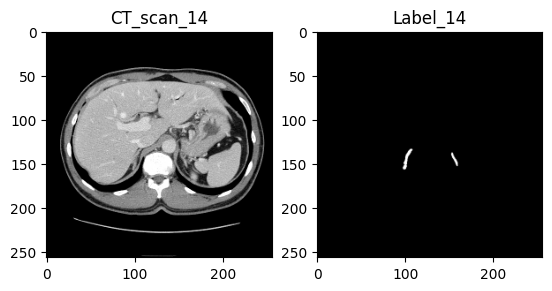

<Figure size 640x480 with 0 Axes>

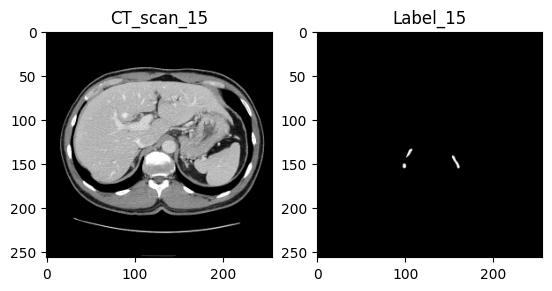

<Figure size 640x480 with 0 Axes>

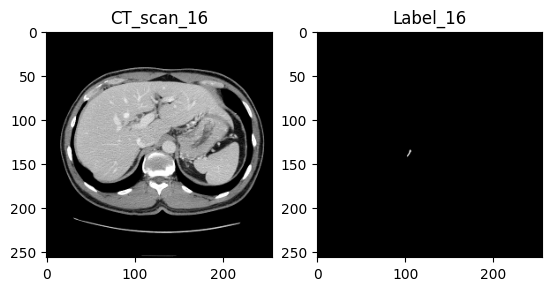

<Figure size 640x480 with 0 Axes>

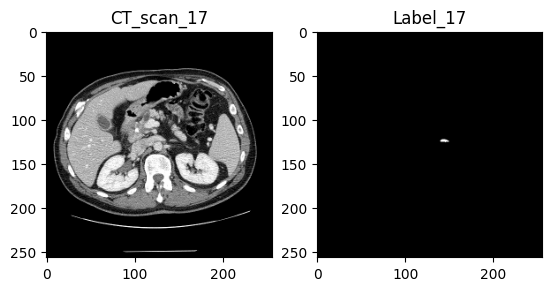

<Figure size 640x480 with 0 Axes>

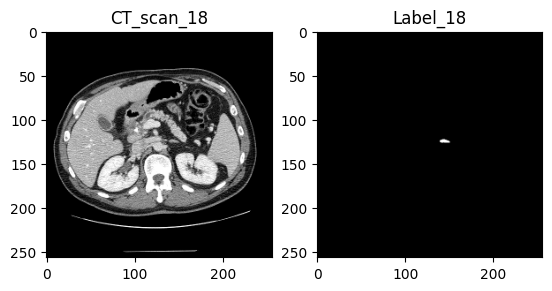

<Figure size 640x480 with 0 Axes>

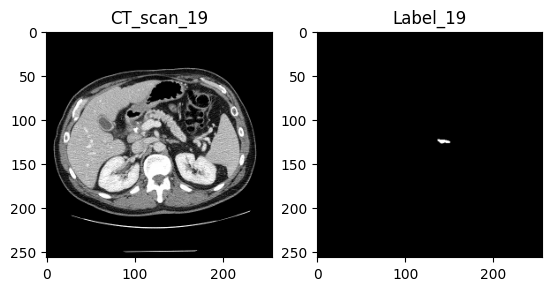

<Figure size 640x480 with 0 Axes>

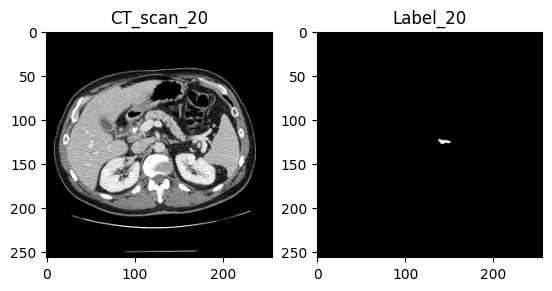

<Figure size 640x480 with 0 Axes>

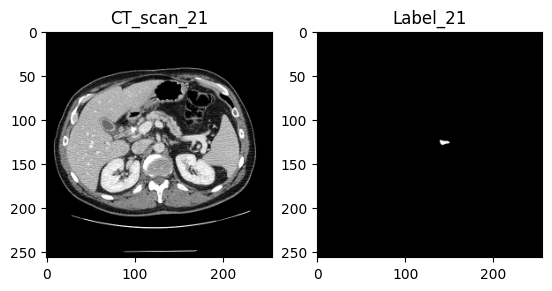

<Figure size 640x480 with 0 Axes>

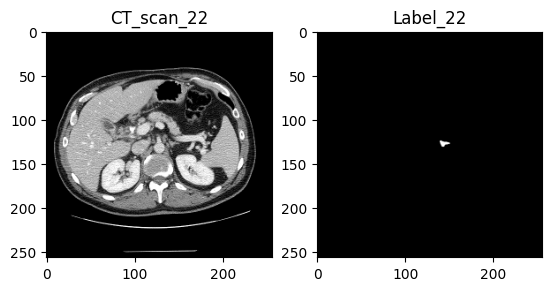

<Figure size 640x480 with 0 Axes>

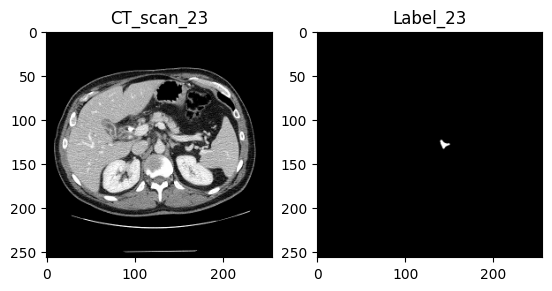

<Figure size 640x480 with 0 Axes>

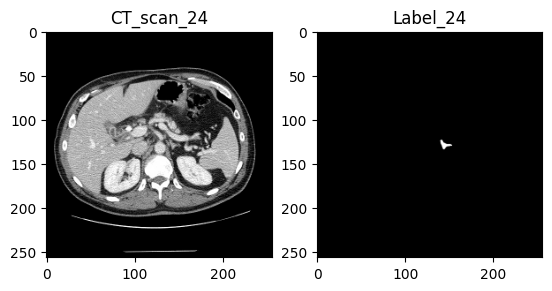

<Figure size 640x480 with 0 Axes>

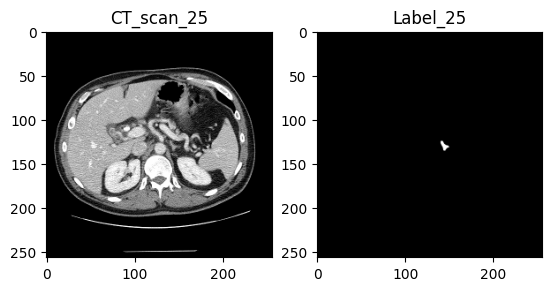

<Figure size 640x480 with 0 Axes>

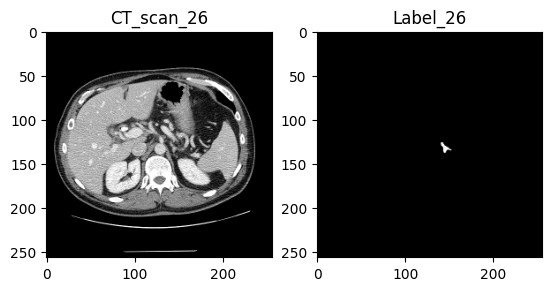

<Figure size 640x480 with 0 Axes>

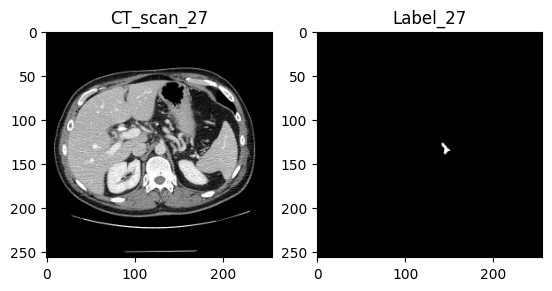

<Figure size 640x480 with 0 Axes>

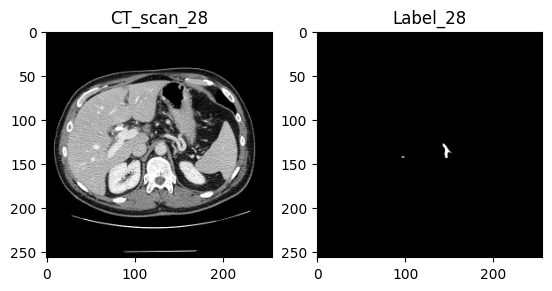

<Figure size 640x480 with 0 Axes>

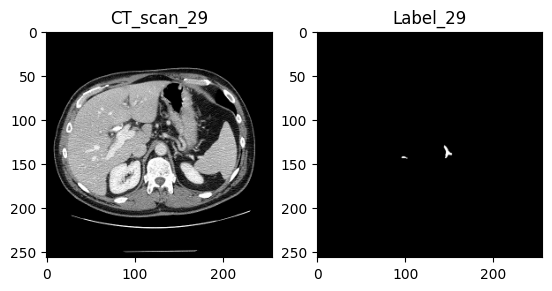

<Figure size 640x480 with 0 Axes>

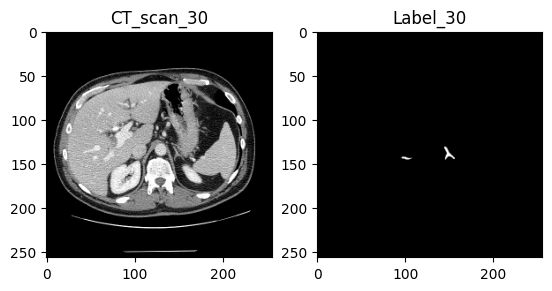

<Figure size 640x480 with 0 Axes>

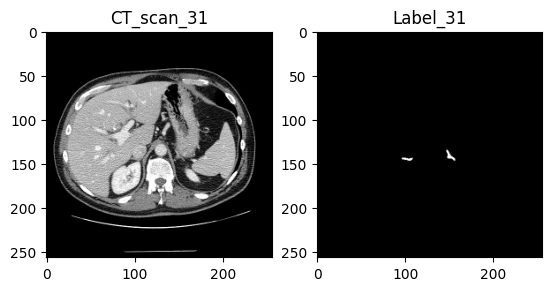

<Figure size 640x480 with 0 Axes>

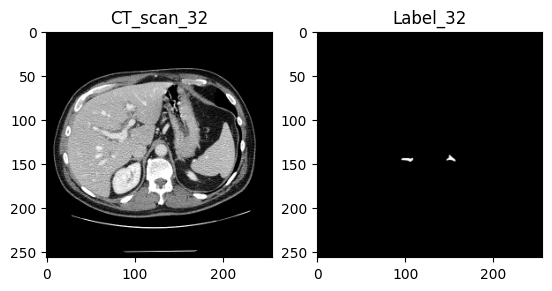

<Figure size 640x480 with 0 Axes>

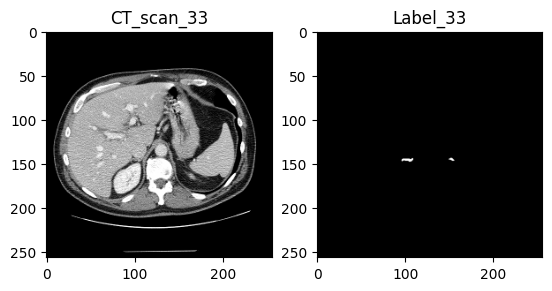

<Figure size 640x480 with 0 Axes>

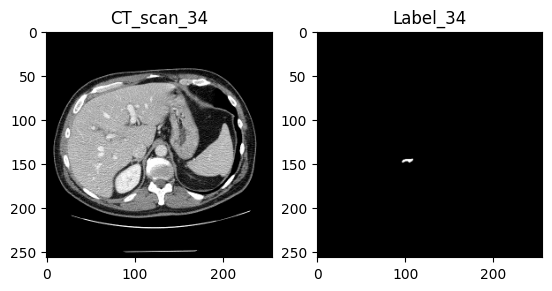

<Figure size 640x480 with 0 Axes>

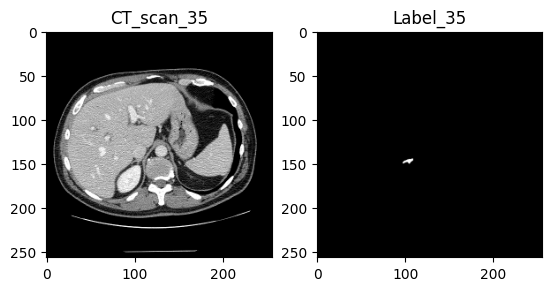

<Figure size 640x480 with 0 Axes>

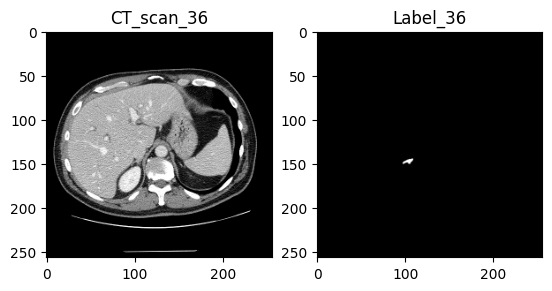

<Figure size 640x480 with 0 Axes>

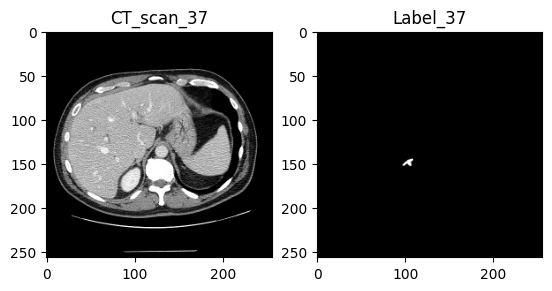

<Figure size 640x480 with 0 Axes>

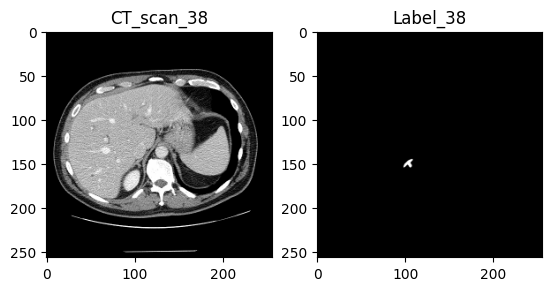

<Figure size 640x480 with 0 Axes>

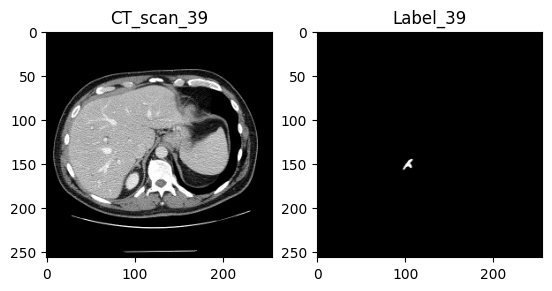

<Figure size 640x480 with 0 Axes>

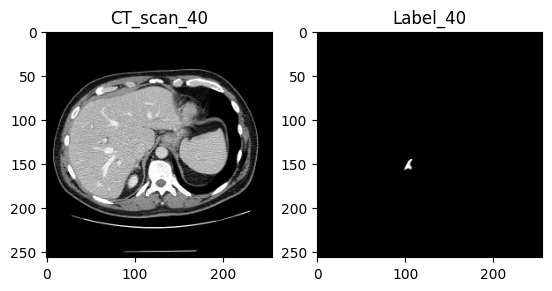

<Figure size 640x480 with 0 Axes>

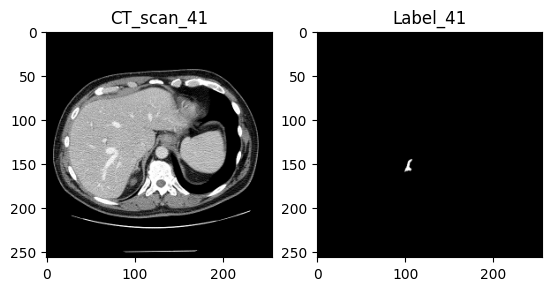

<Figure size 640x480 with 0 Axes>

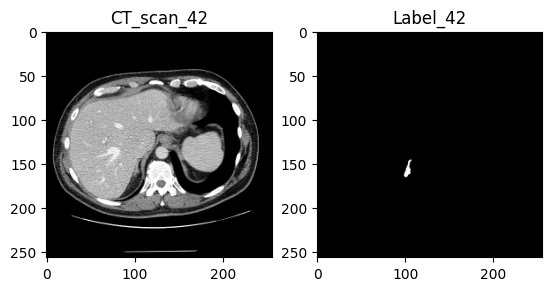

<Figure size 640x480 with 0 Axes>

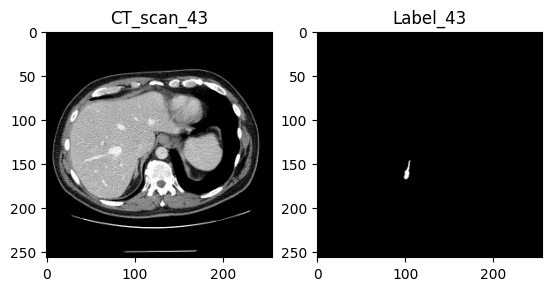

<Figure size 640x480 with 0 Axes>

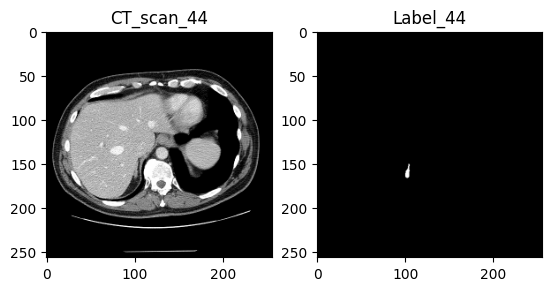

<Figure size 640x480 with 0 Axes>

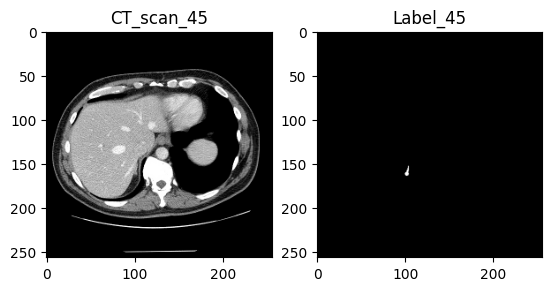

<Figure size 640x480 with 0 Axes>

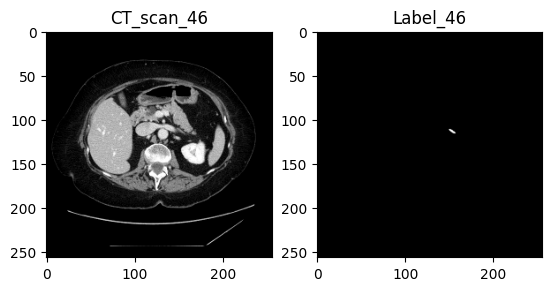

<Figure size 640x480 with 0 Axes>

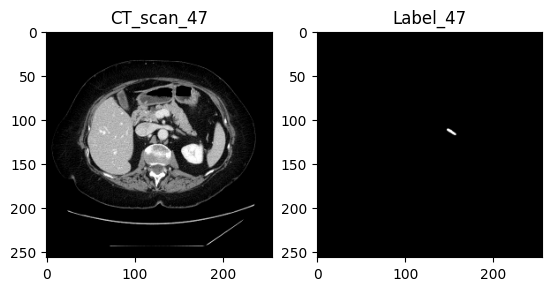

<Figure size 640x480 with 0 Axes>

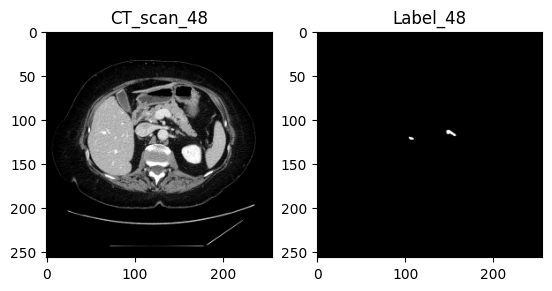

<Figure size 640x480 with 0 Axes>

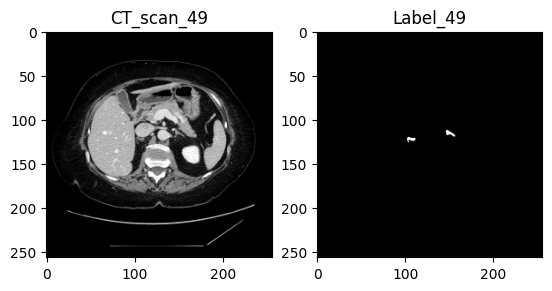

<Figure size 640x480 with 0 Axes>

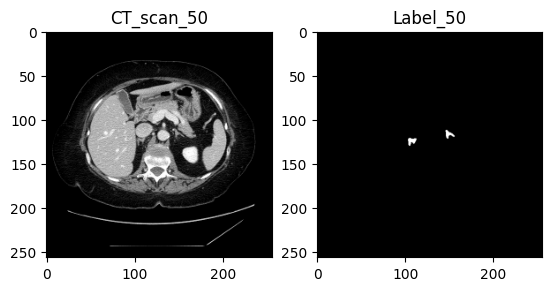

<Figure size 640x480 with 0 Axes>

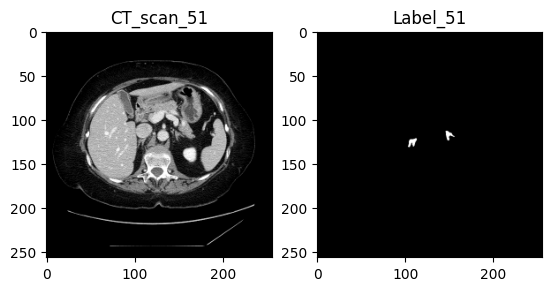

<Figure size 640x480 with 0 Axes>

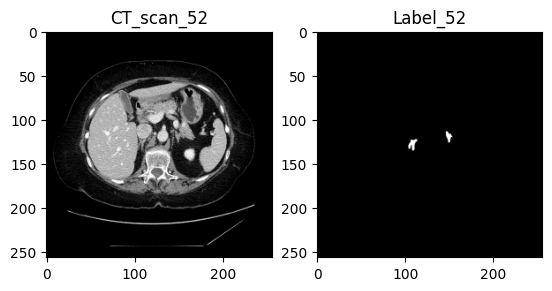

<Figure size 640x480 with 0 Axes>

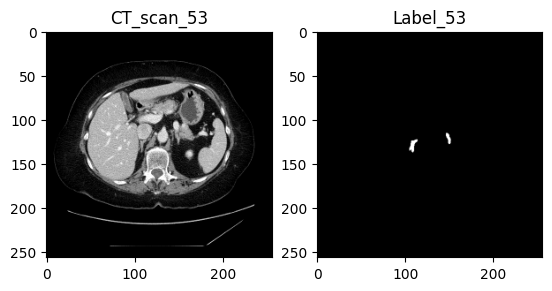

<Figure size 640x480 with 0 Axes>

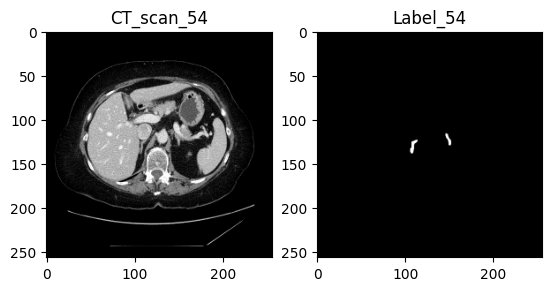

<Figure size 640x480 with 0 Axes>

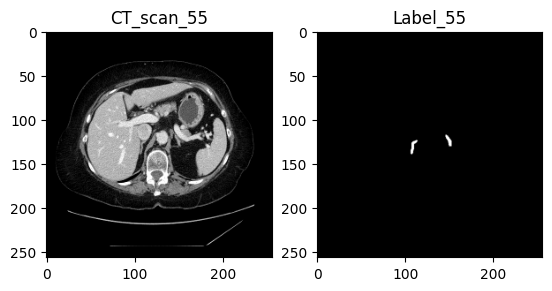

<Figure size 640x480 with 0 Axes>

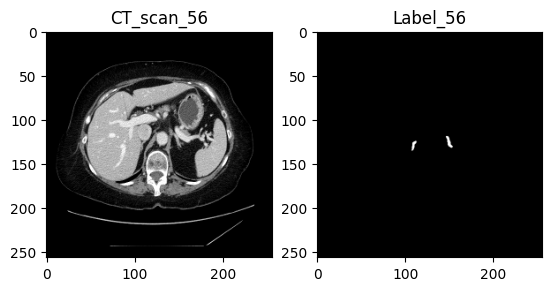

<Figure size 640x480 with 0 Axes>

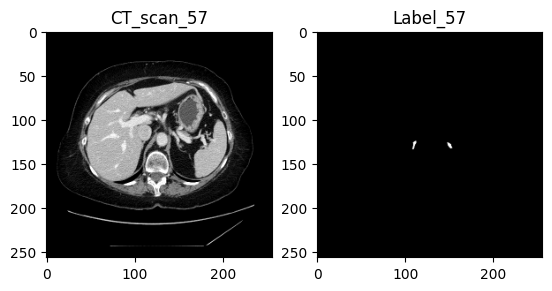

<Figure size 640x480 with 0 Axes>

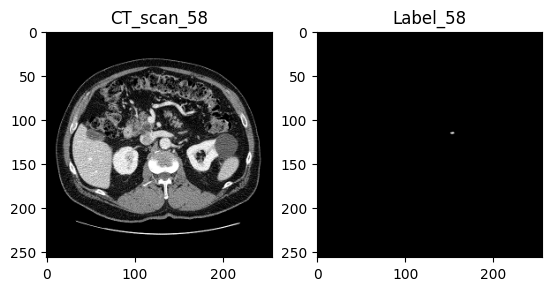

<Figure size 640x480 with 0 Axes>

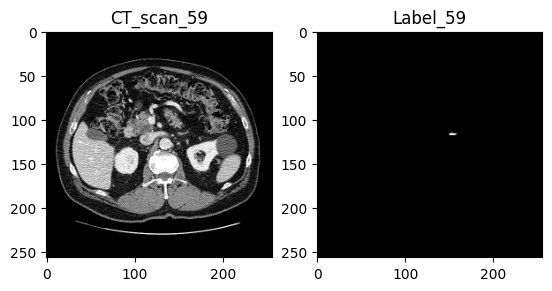

<Figure size 640x480 with 0 Axes>

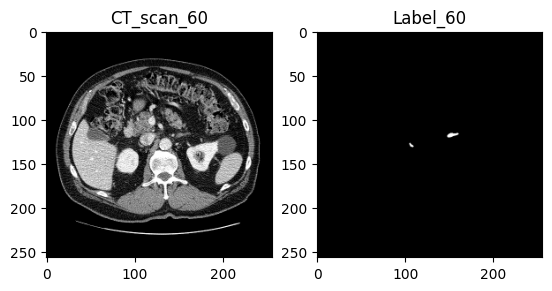

<Figure size 640x480 with 0 Axes>

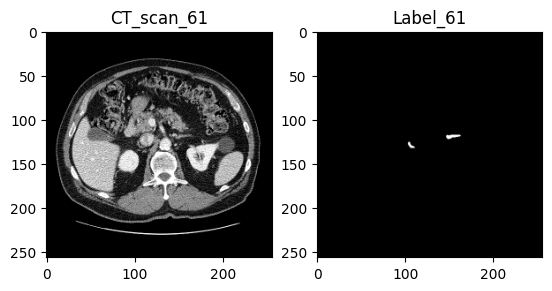

<Figure size 640x480 with 0 Axes>

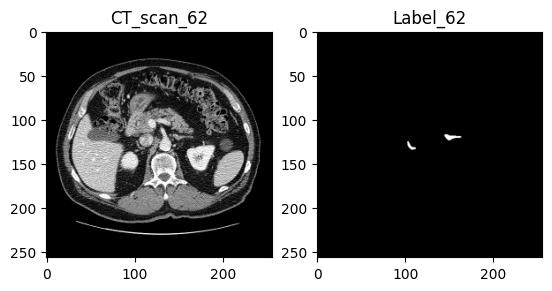

<Figure size 640x480 with 0 Axes>

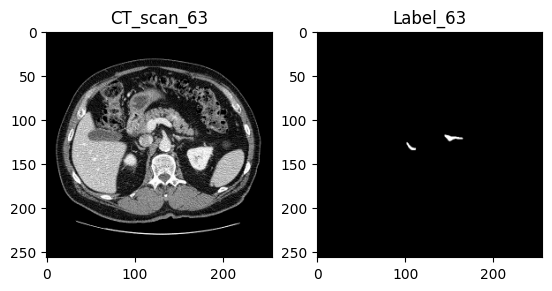

<Figure size 640x480 with 0 Axes>

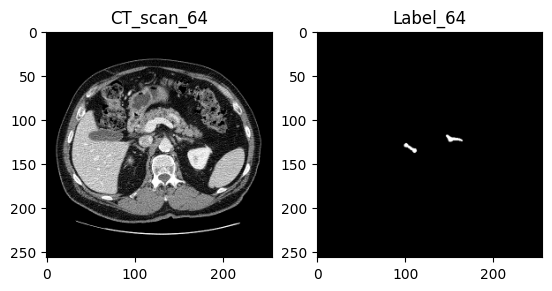

<Figure size 640x480 with 0 Axes>

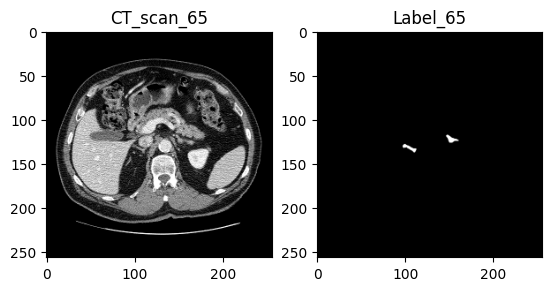

<Figure size 640x480 with 0 Axes>

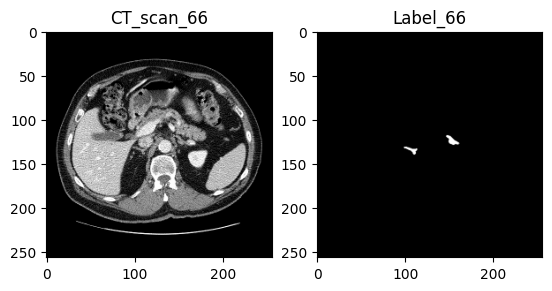

<Figure size 640x480 with 0 Axes>

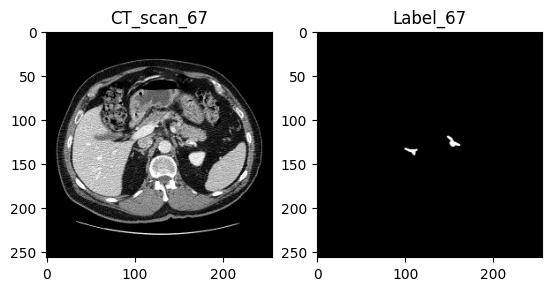

<Figure size 640x480 with 0 Axes>

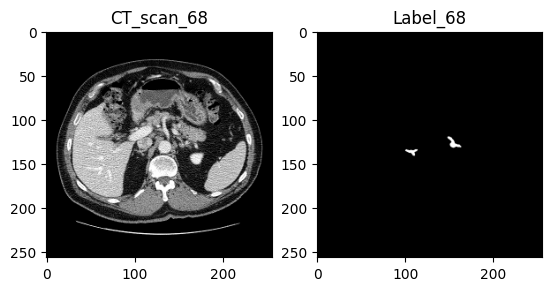

<Figure size 640x480 with 0 Axes>

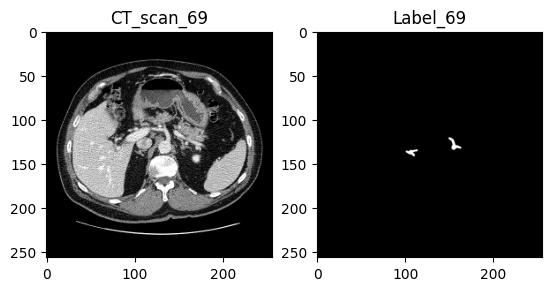

<Figure size 640x480 with 0 Axes>

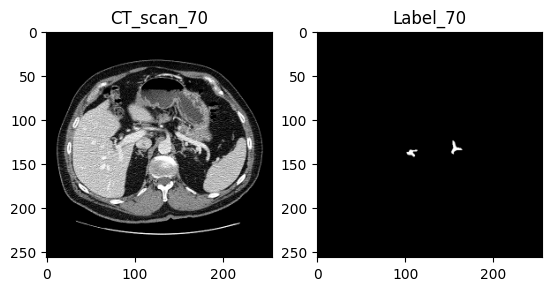

<Figure size 640x480 with 0 Axes>

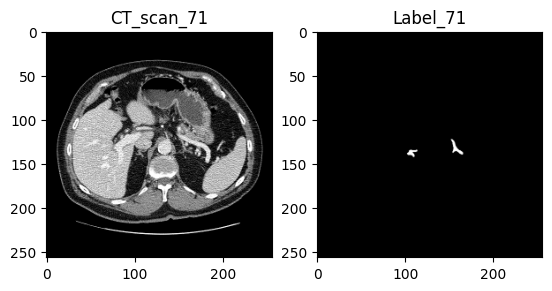

<Figure size 640x480 with 0 Axes>

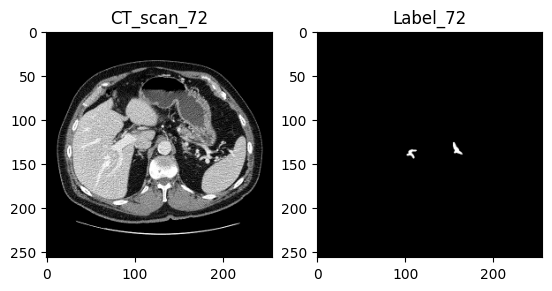

<Figure size 640x480 with 0 Axes>

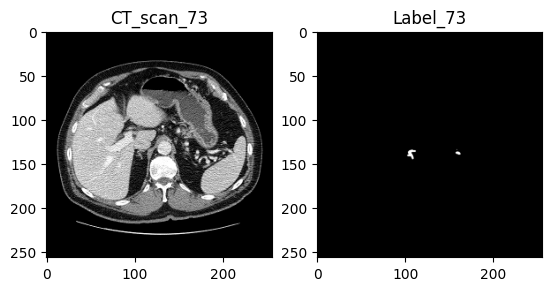

<Figure size 640x480 with 0 Axes>

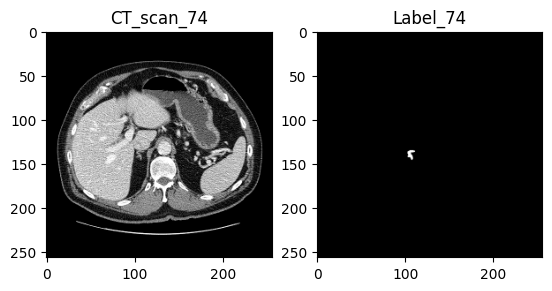

<Figure size 640x480 with 0 Axes>

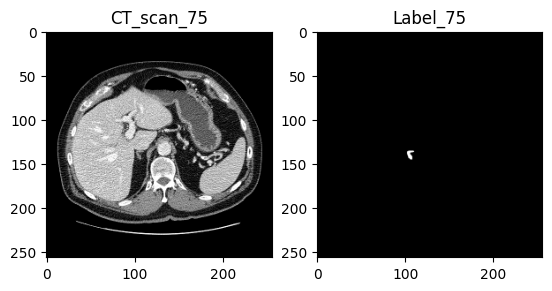

<Figure size 640x480 with 0 Axes>

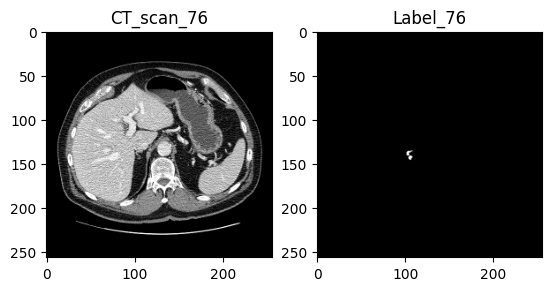

<Figure size 640x480 with 0 Axes>

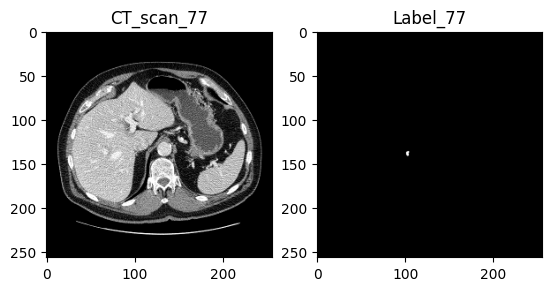

<Figure size 640x480 with 0 Axes>

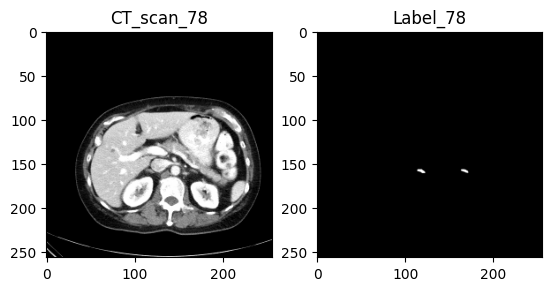

<Figure size 640x480 with 0 Axes>

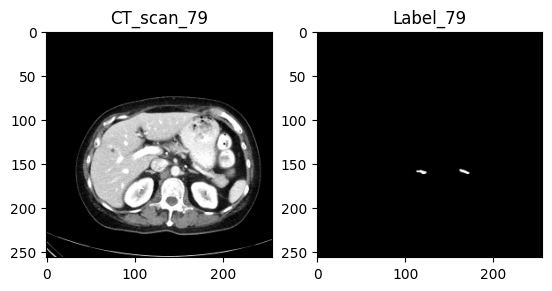

<Figure size 640x480 with 0 Axes>

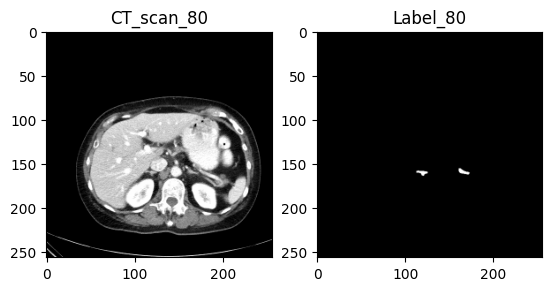

<Figure size 640x480 with 0 Axes>

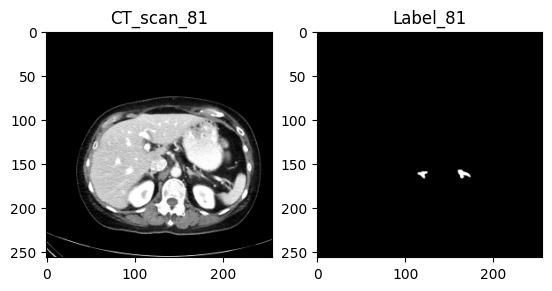

<Figure size 640x480 with 0 Axes>

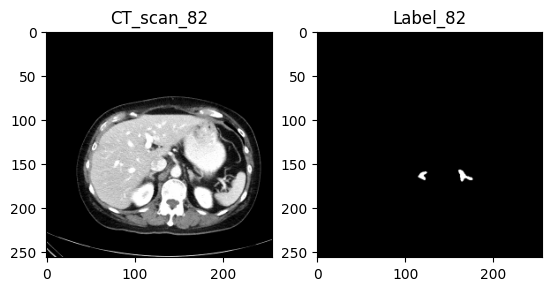

<Figure size 640x480 with 0 Axes>

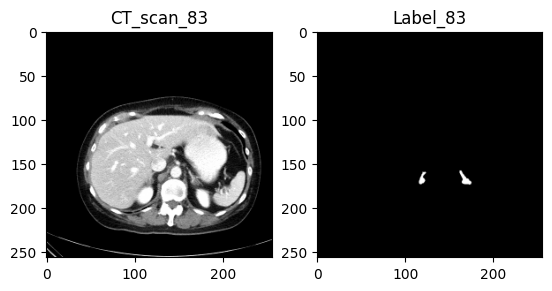

<Figure size 640x480 with 0 Axes>

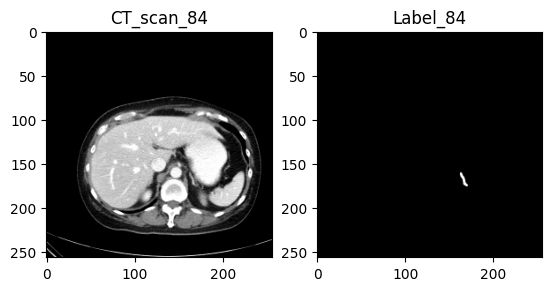

<Figure size 640x480 with 0 Axes>

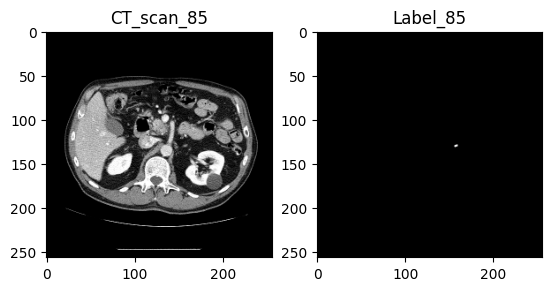

<Figure size 640x480 with 0 Axes>

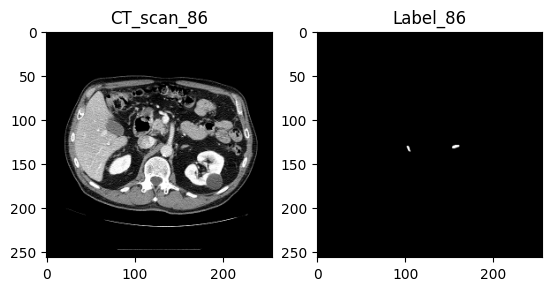

<Figure size 640x480 with 0 Axes>

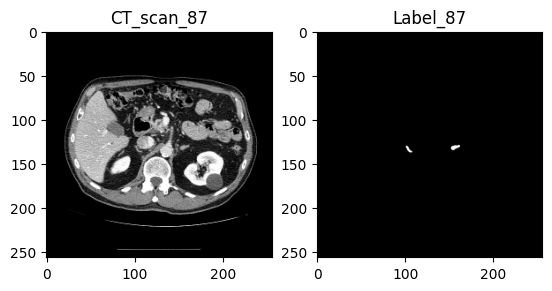

<Figure size 640x480 with 0 Axes>

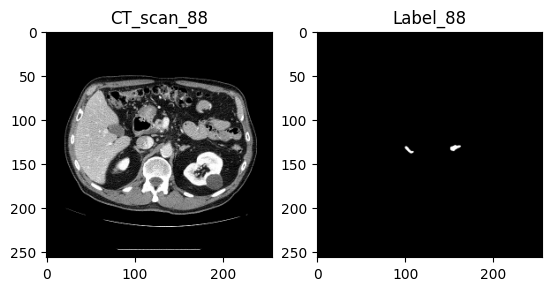

<Figure size 640x480 with 0 Axes>

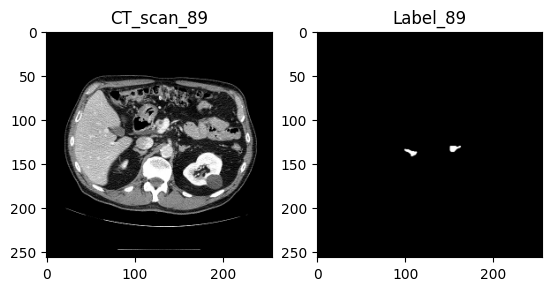

<Figure size 640x480 with 0 Axes>

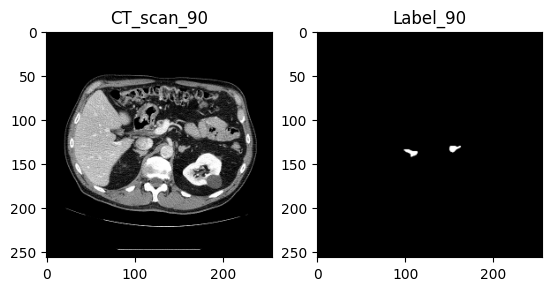

<Figure size 640x480 with 0 Axes>

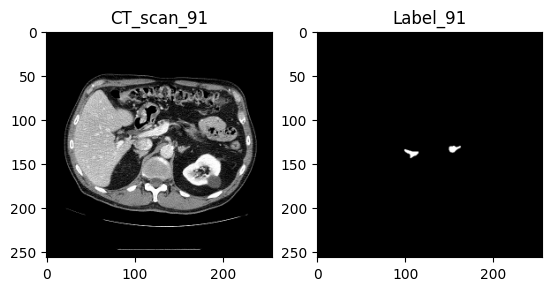

<Figure size 640x480 with 0 Axes>

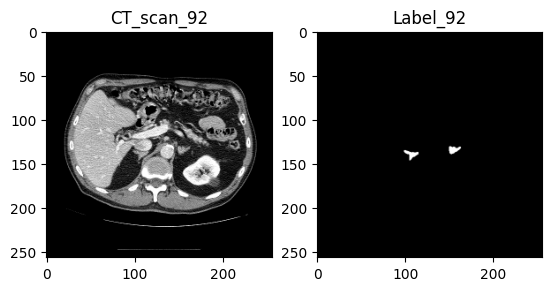

<Figure size 640x480 with 0 Axes>

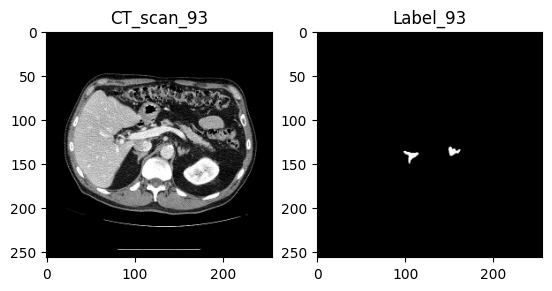

<Figure size 640x480 with 0 Axes>

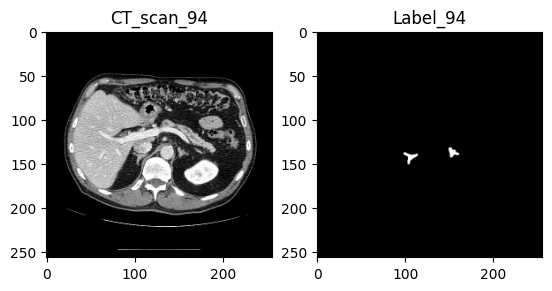

<Figure size 640x480 with 0 Axes>

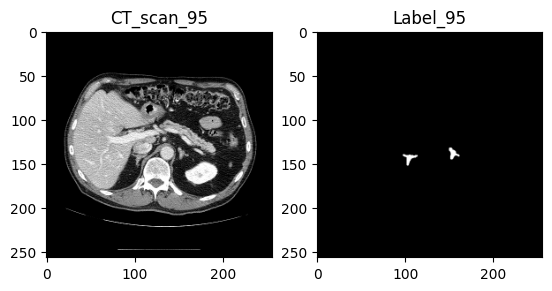

<Figure size 640x480 with 0 Axes>

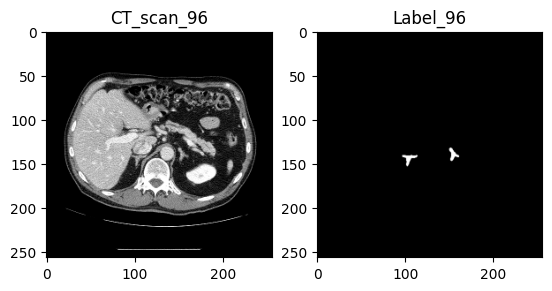

<Figure size 640x480 with 0 Axes>

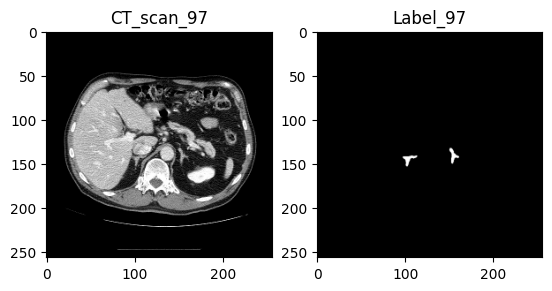

<Figure size 640x480 with 0 Axes>

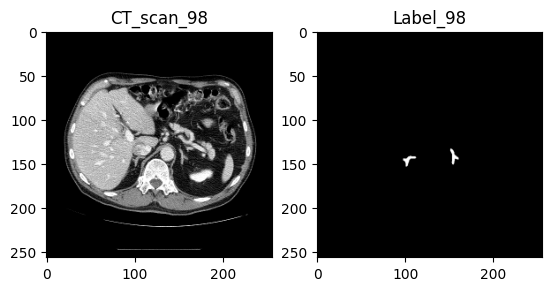

<Figure size 640x480 with 0 Axes>

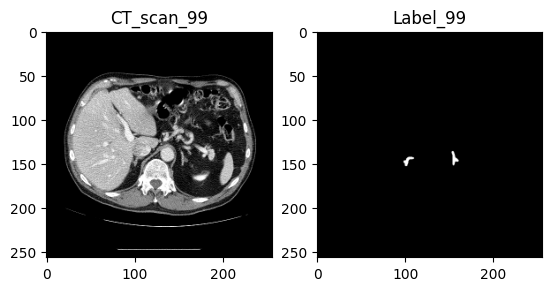

<Figure size 640x480 with 0 Axes>

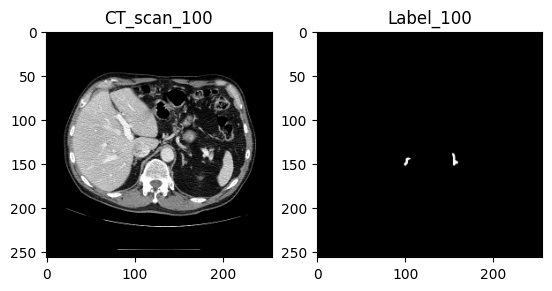

<Figure size 640x480 with 0 Axes>

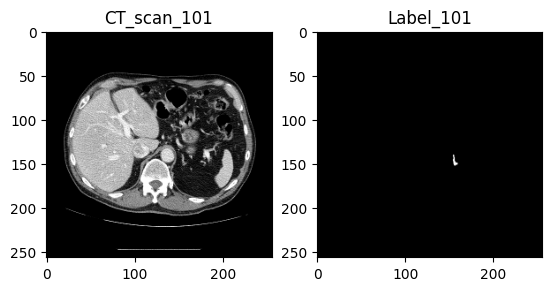

<Figure size 640x480 with 0 Axes>

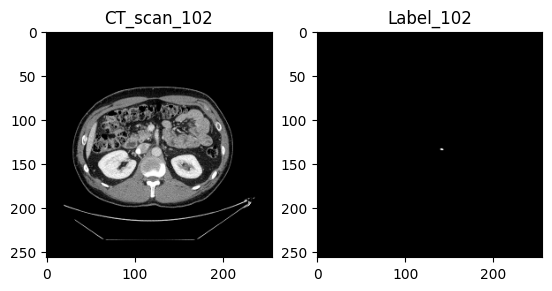

<Figure size 640x480 with 0 Axes>

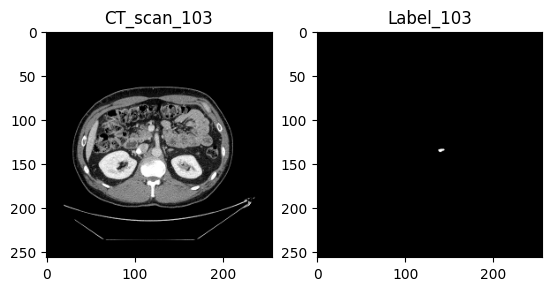

<Figure size 640x480 with 0 Axes>

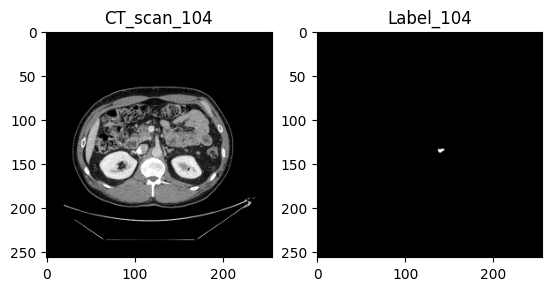

<Figure size 640x480 with 0 Axes>

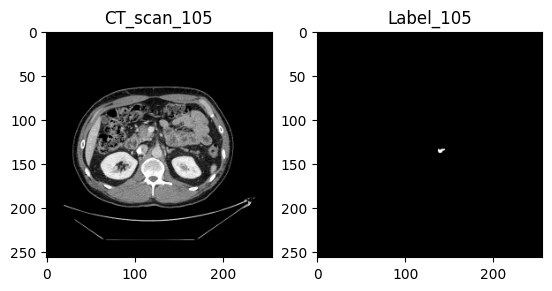

<Figure size 640x480 with 0 Axes>

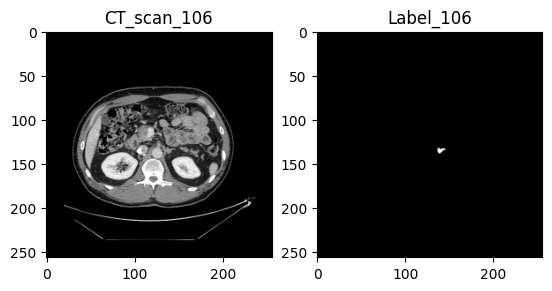

<Figure size 640x480 with 0 Axes>

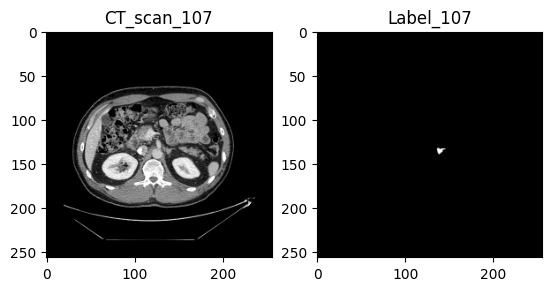

<Figure size 640x480 with 0 Axes>

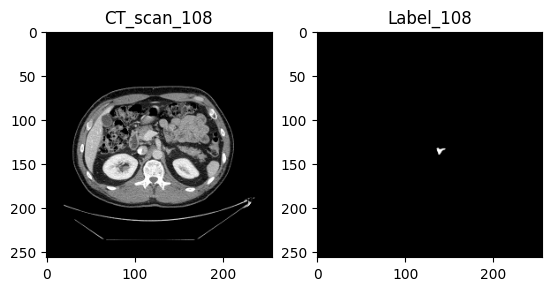

<Figure size 640x480 with 0 Axes>

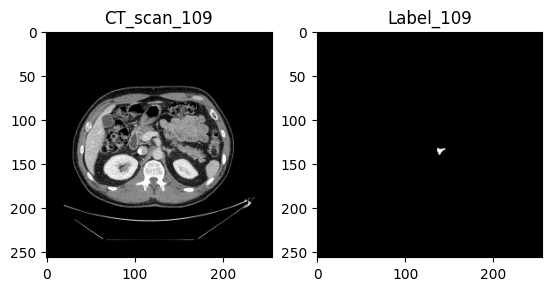

<Figure size 640x480 with 0 Axes>

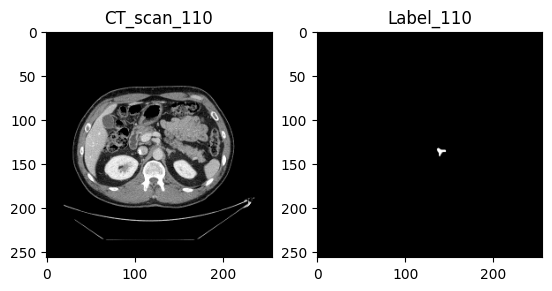

<Figure size 640x480 with 0 Axes>

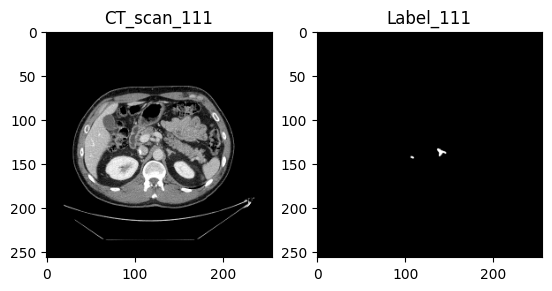

<Figure size 640x480 with 0 Axes>

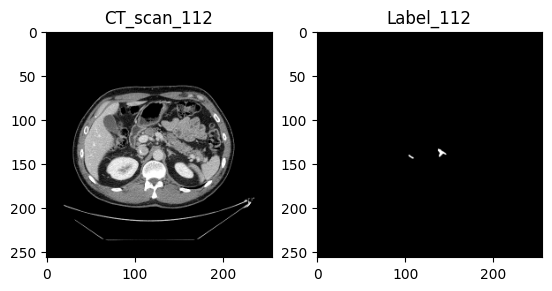

<Figure size 640x480 with 0 Axes>

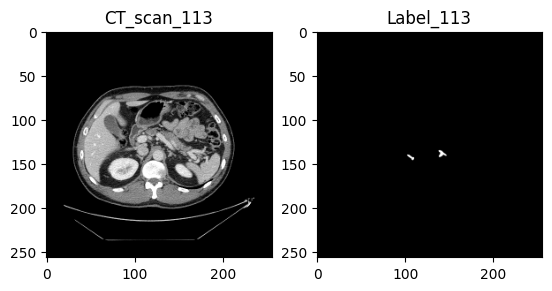

<Figure size 640x480 with 0 Axes>

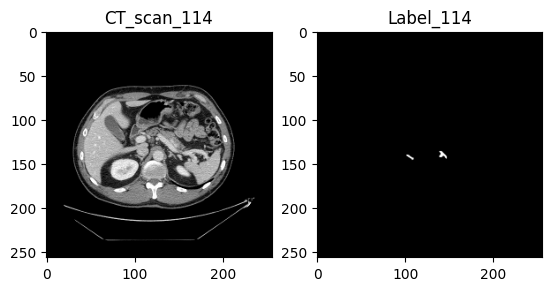

<Figure size 640x480 with 0 Axes>

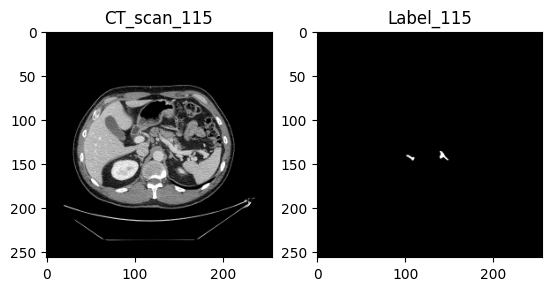

<Figure size 640x480 with 0 Axes>

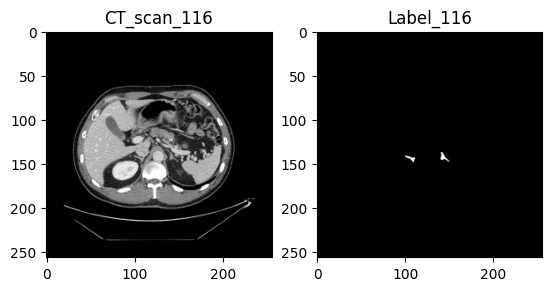

<Figure size 640x480 with 0 Axes>

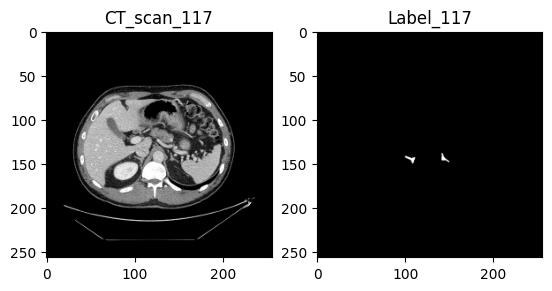

<Figure size 640x480 with 0 Axes>

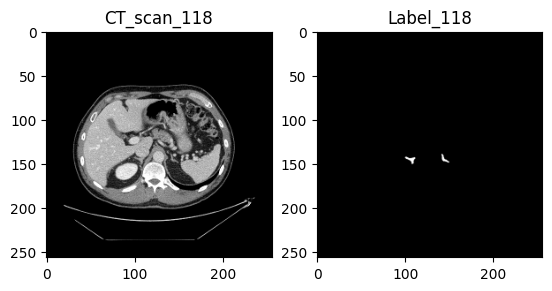

<Figure size 640x480 with 0 Axes>

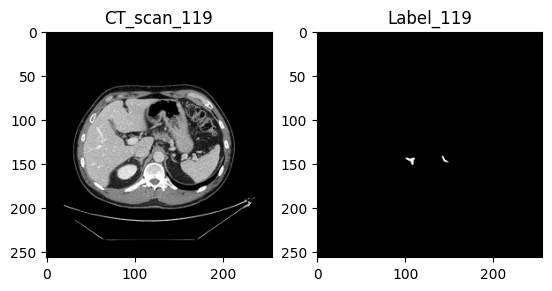

<Figure size 640x480 with 0 Axes>

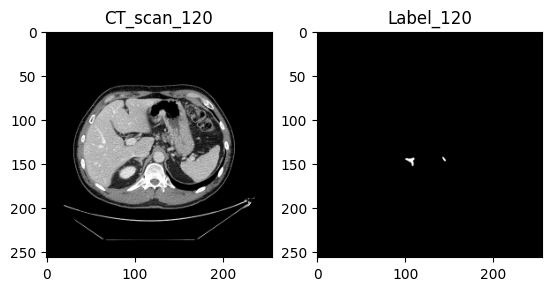

<Figure size 640x480 with 0 Axes>

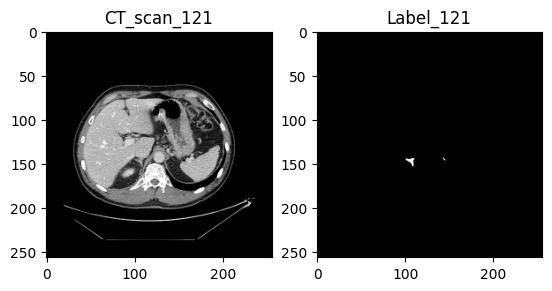

<Figure size 640x480 with 0 Axes>

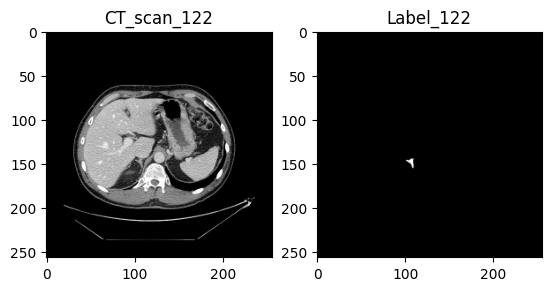

<Figure size 640x480 with 0 Axes>

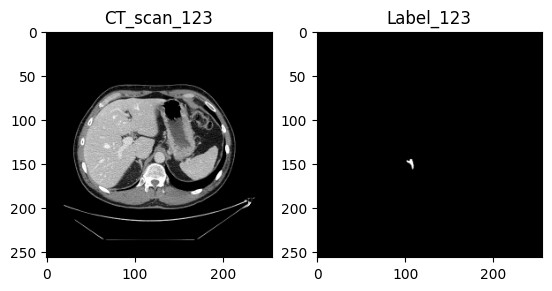

<Figure size 640x480 with 0 Axes>

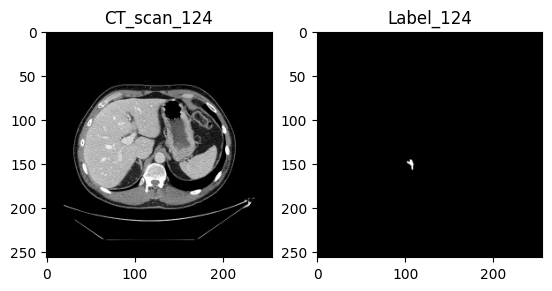

<Figure size 640x480 with 0 Axes>

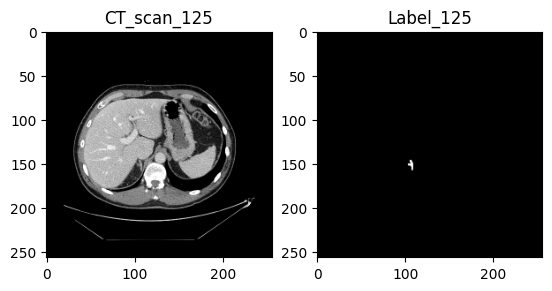

<Figure size 640x480 with 0 Axes>

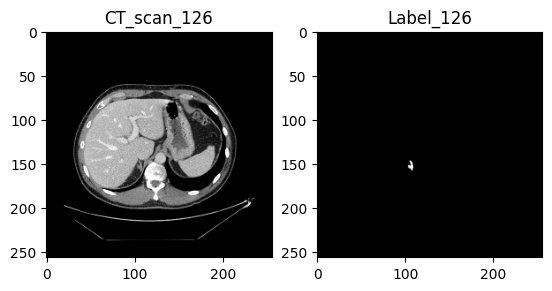

<Figure size 640x480 with 0 Axes>

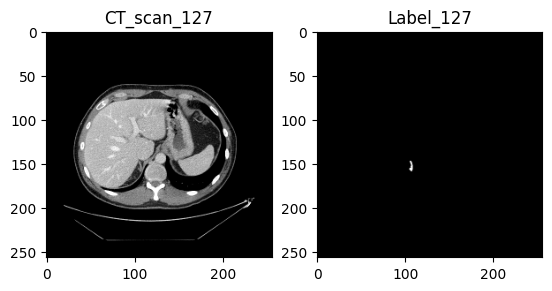

<Figure size 640x480 with 0 Axes>

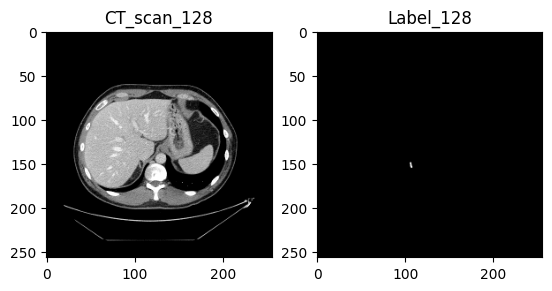

<Figure size 640x480 with 0 Axes>

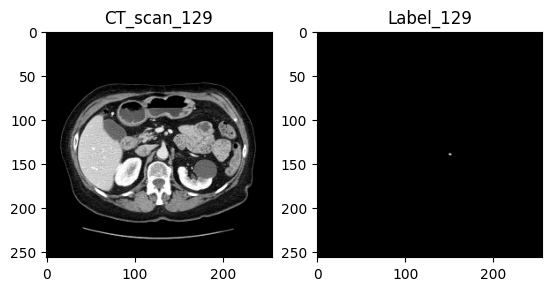

<Figure size 640x480 with 0 Axes>

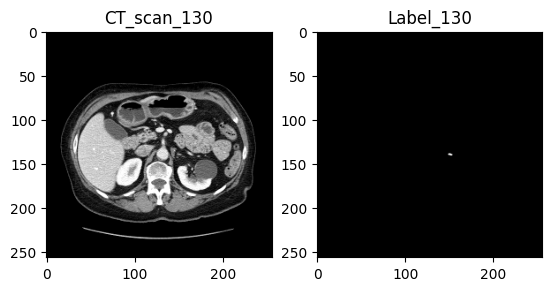

<Figure size 640x480 with 0 Axes>

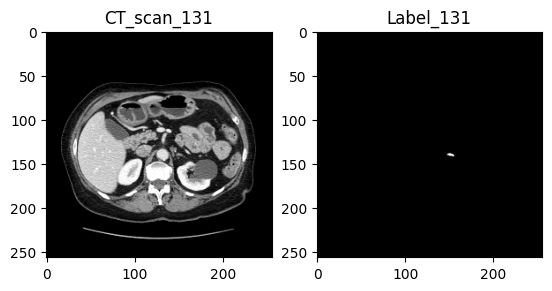

<Figure size 640x480 with 0 Axes>

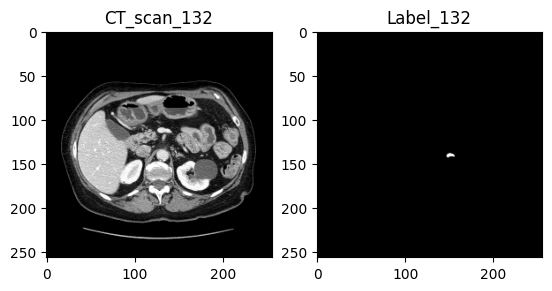

<Figure size 640x480 with 0 Axes>

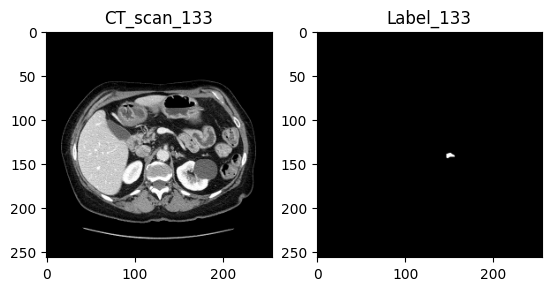

<Figure size 640x480 with 0 Axes>

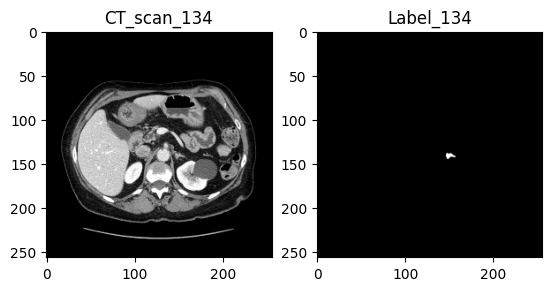

<Figure size 640x480 with 0 Axes>

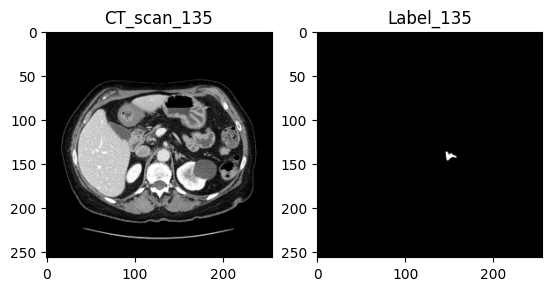

<Figure size 640x480 with 0 Axes>

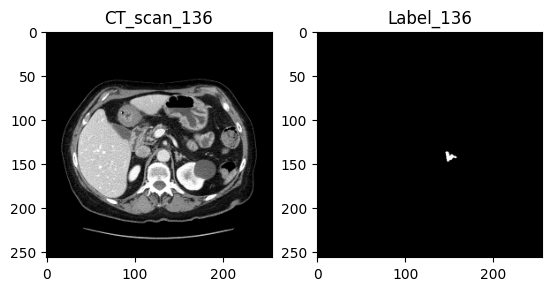

<Figure size 640x480 with 0 Axes>

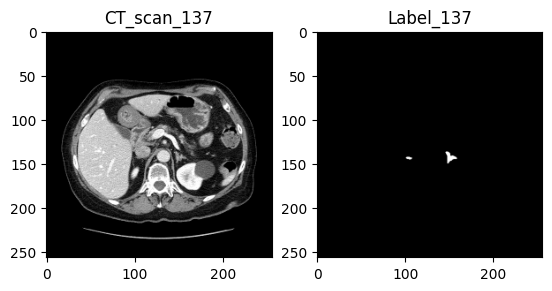

<Figure size 640x480 with 0 Axes>

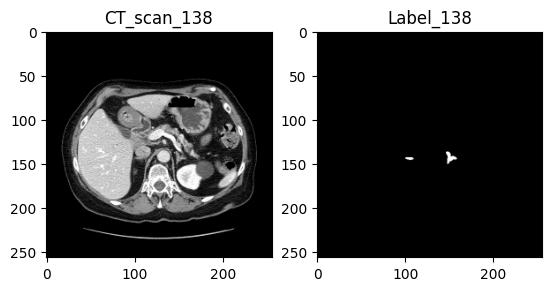

<Figure size 640x480 with 0 Axes>

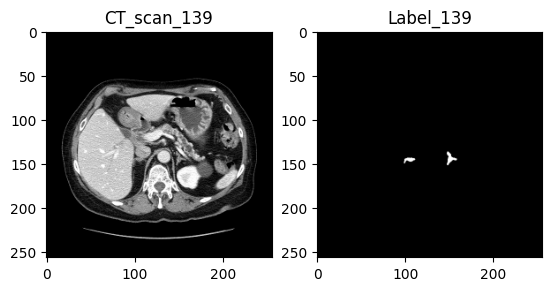

<Figure size 640x480 with 0 Axes>

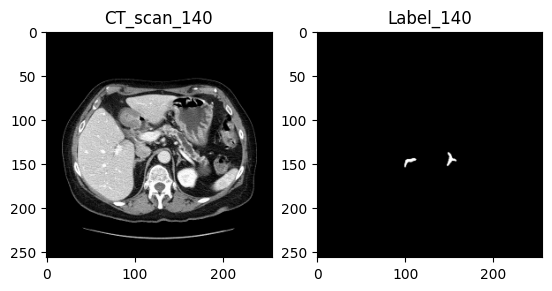

<Figure size 640x480 with 0 Axes>

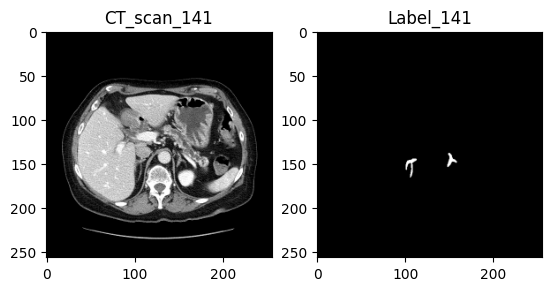

<Figure size 640x480 with 0 Axes>

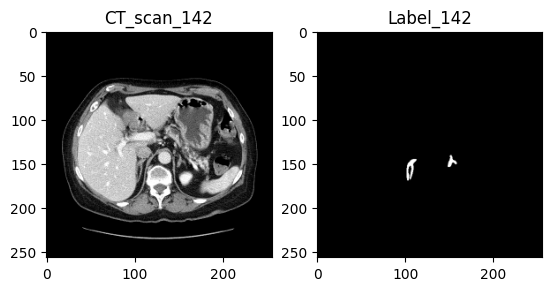

<Figure size 640x480 with 0 Axes>

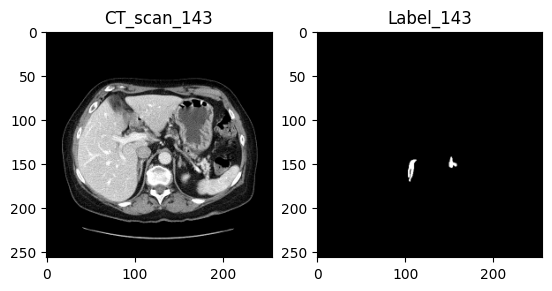

<Figure size 640x480 with 0 Axes>

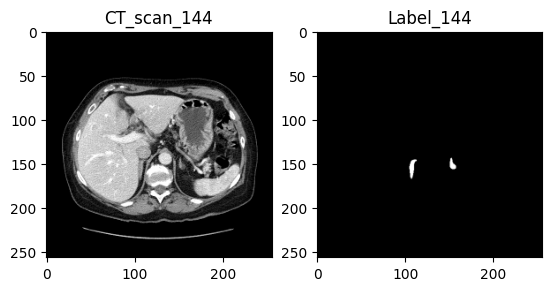

<Figure size 640x480 with 0 Axes>

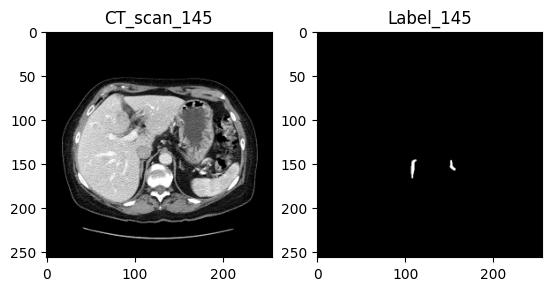

<Figure size 640x480 with 0 Axes>

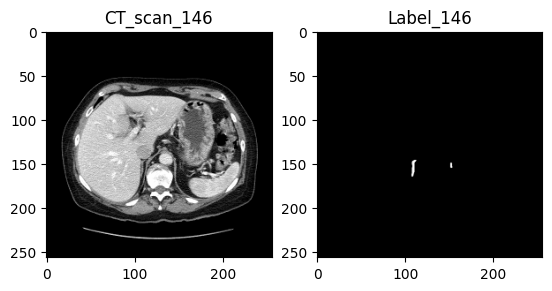

<Figure size 640x480 with 0 Axes>

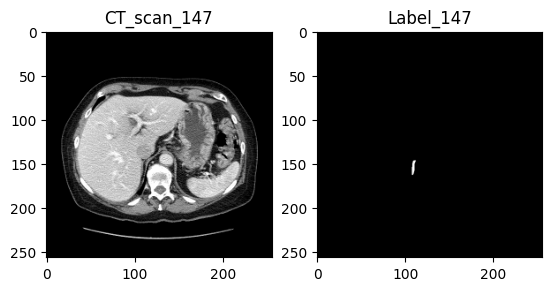

<Figure size 640x480 with 0 Axes>

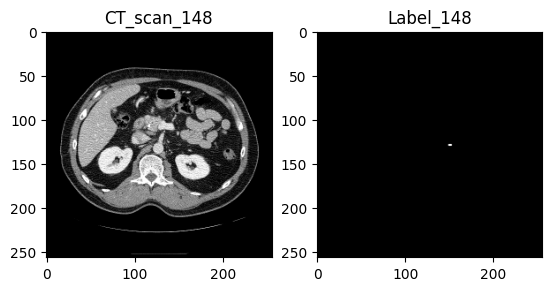

<Figure size 640x480 with 0 Axes>

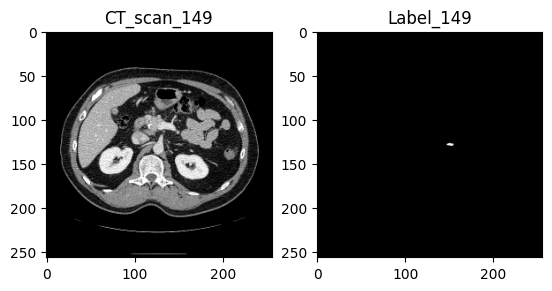

<Figure size 640x480 with 0 Axes>

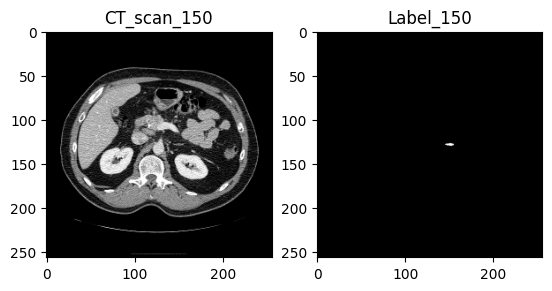

<Figure size 640x480 with 0 Axes>

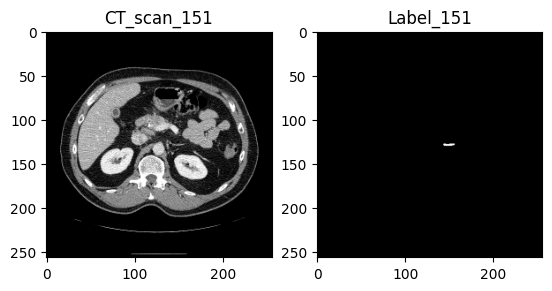

<Figure size 640x480 with 0 Axes>

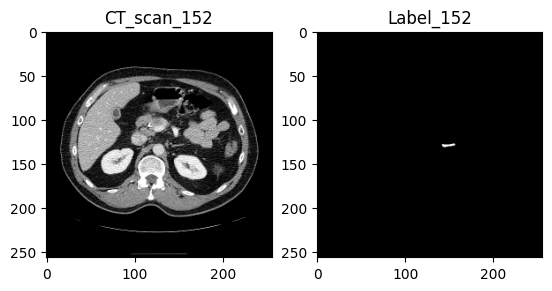

<Figure size 640x480 with 0 Axes>

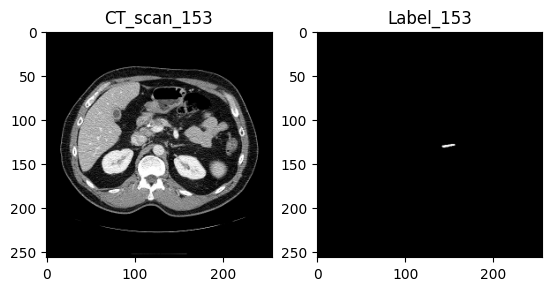

<Figure size 640x480 with 0 Axes>

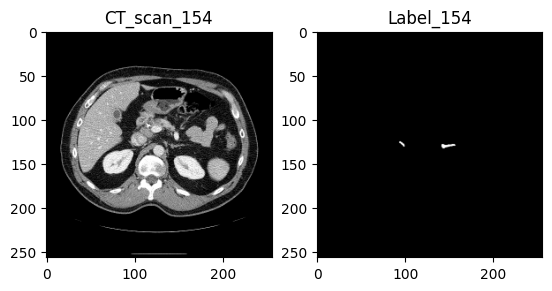

<Figure size 640x480 with 0 Axes>

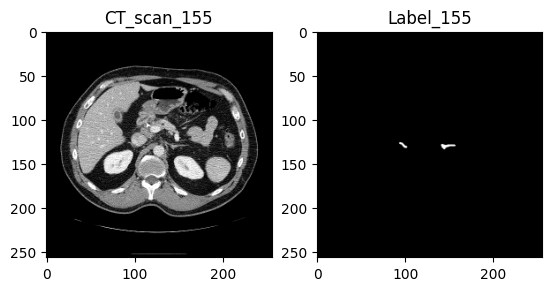

<Figure size 640x480 with 0 Axes>

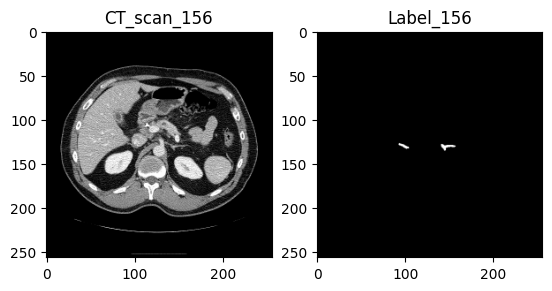

<Figure size 640x480 with 0 Axes>

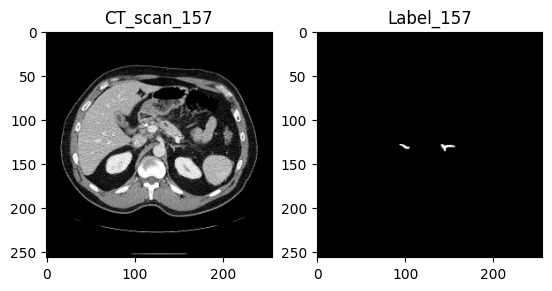

<Figure size 640x480 with 0 Axes>

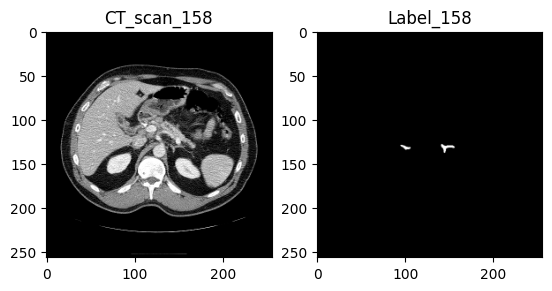

<Figure size 640x480 with 0 Axes>

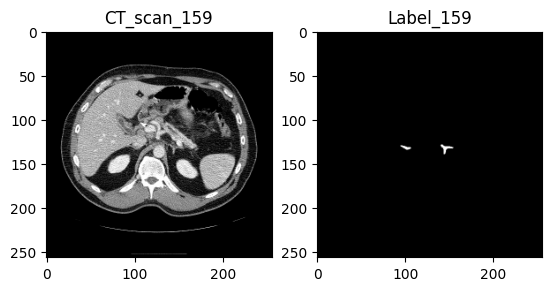

<Figure size 640x480 with 0 Axes>

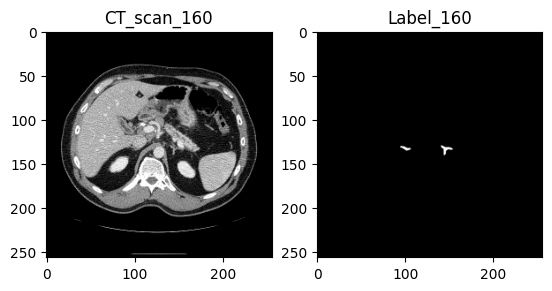

<Figure size 640x480 with 0 Axes>

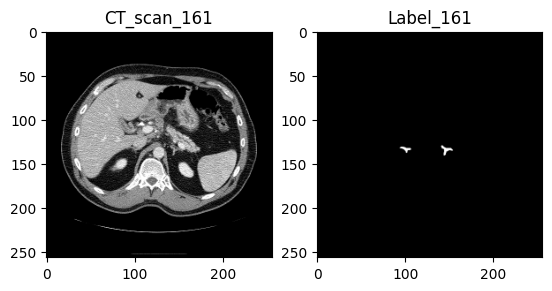

<Figure size 640x480 with 0 Axes>

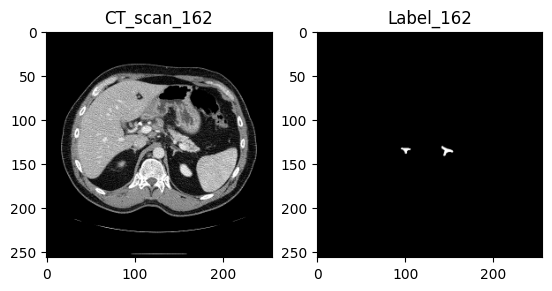

<Figure size 640x480 with 0 Axes>

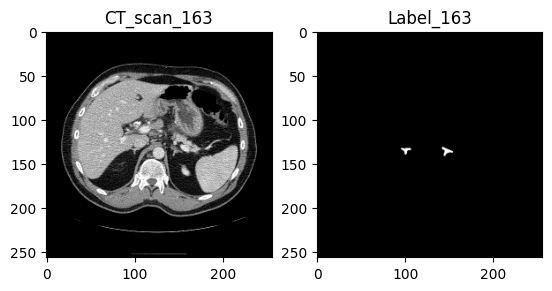

<Figure size 640x480 with 0 Axes>

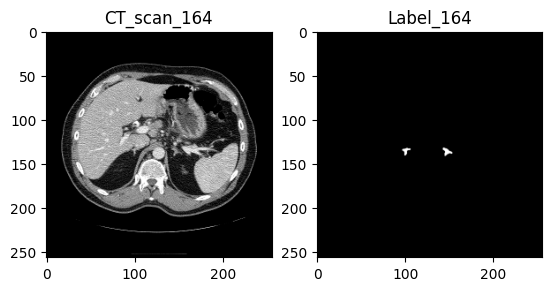

<Figure size 640x480 with 0 Axes>

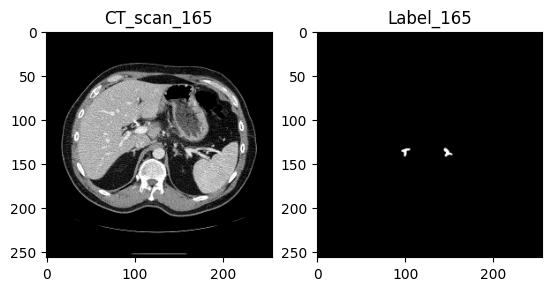

<Figure size 640x480 with 0 Axes>

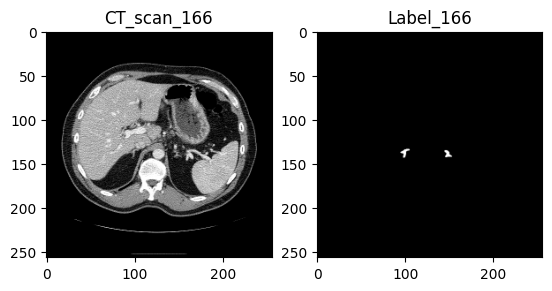

<Figure size 640x480 with 0 Axes>

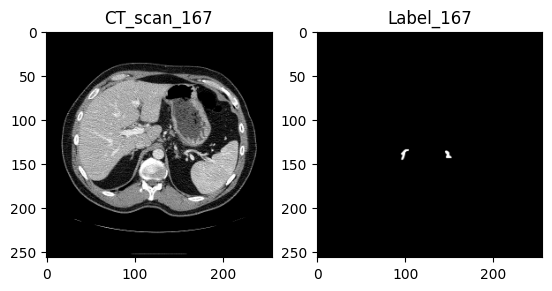

<Figure size 640x480 with 0 Axes>

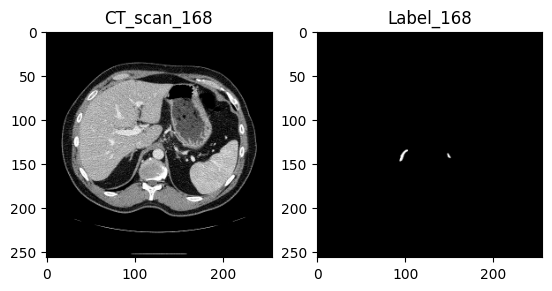

<Figure size 640x480 with 0 Axes>

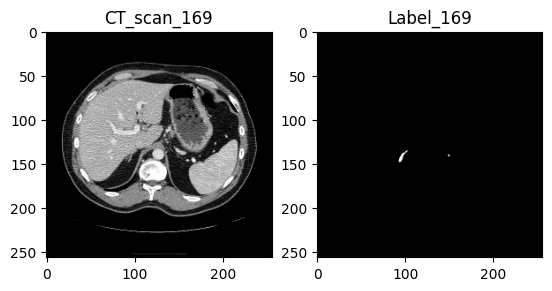

<Figure size 640x480 with 0 Axes>

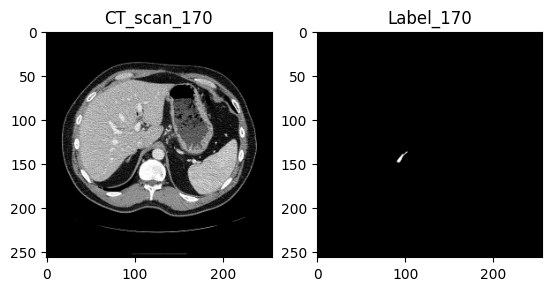

<Figure size 640x480 with 0 Axes>

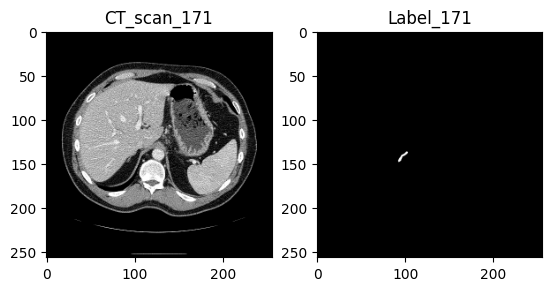

<Figure size 640x480 with 0 Axes>

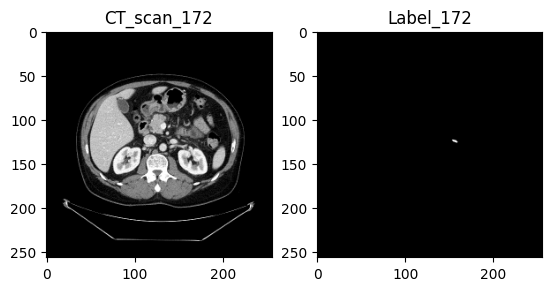

<Figure size 640x480 with 0 Axes>

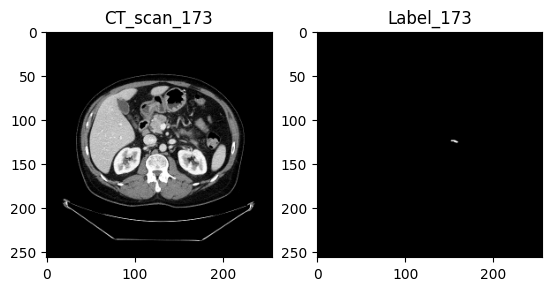

<Figure size 640x480 with 0 Axes>

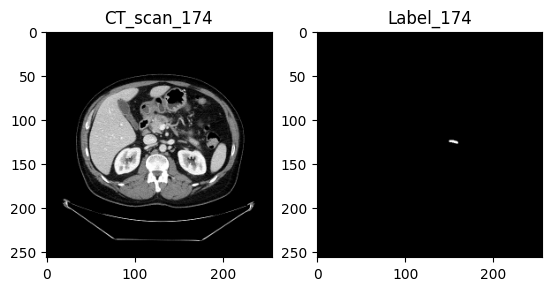

<Figure size 640x480 with 0 Axes>

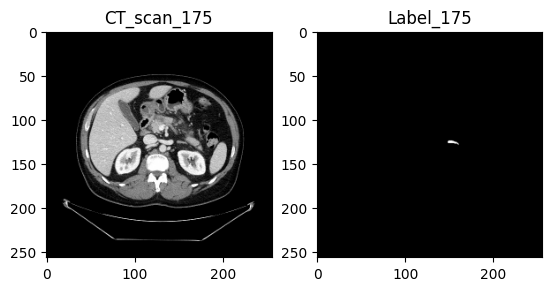

<Figure size 640x480 with 0 Axes>

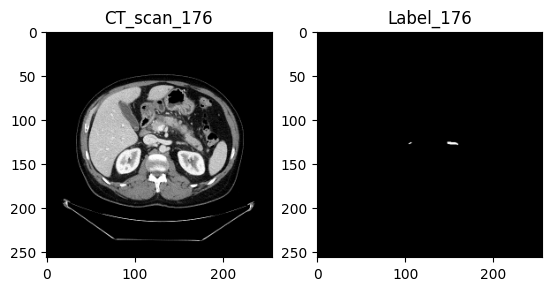

<Figure size 640x480 with 0 Axes>

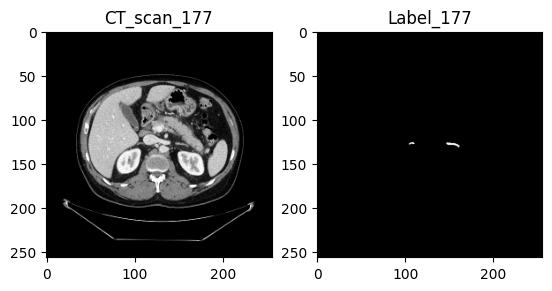

<Figure size 640x480 with 0 Axes>

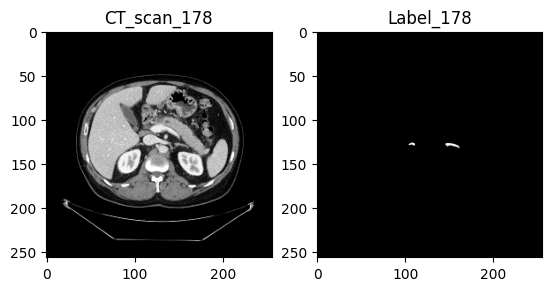

<Figure size 640x480 with 0 Axes>

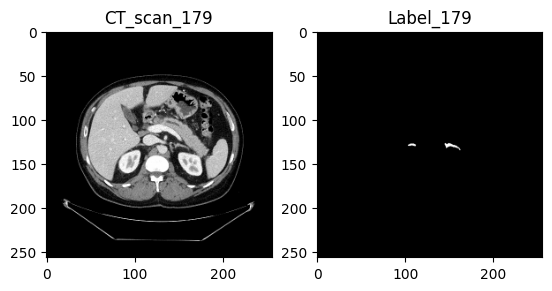

<Figure size 640x480 with 0 Axes>

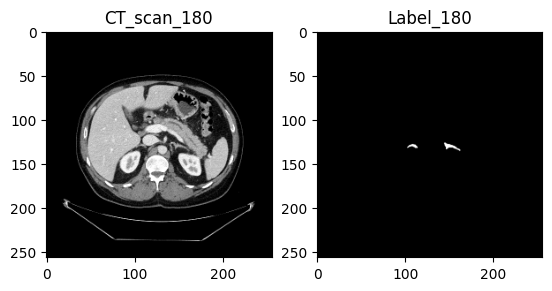

<Figure size 640x480 with 0 Axes>

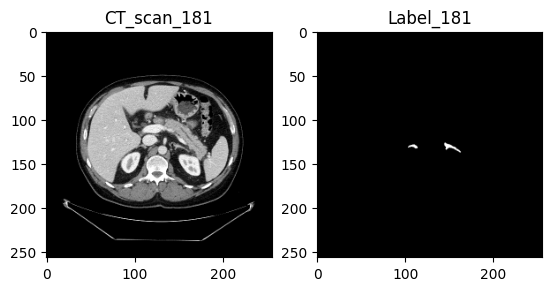

<Figure size 640x480 with 0 Axes>

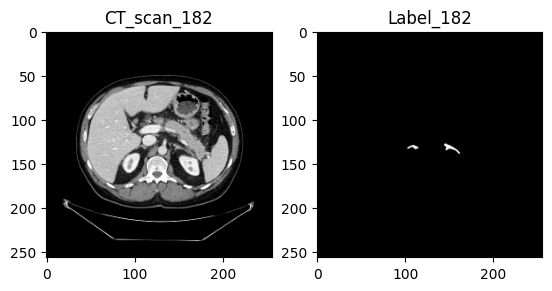

<Figure size 640x480 with 0 Axes>

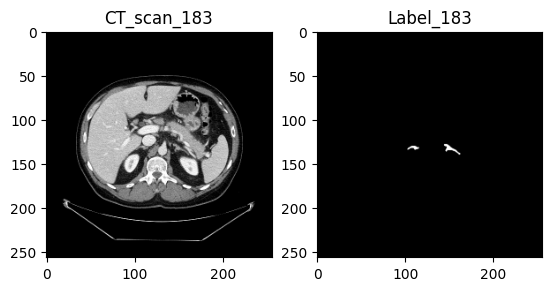

<Figure size 640x480 with 0 Axes>

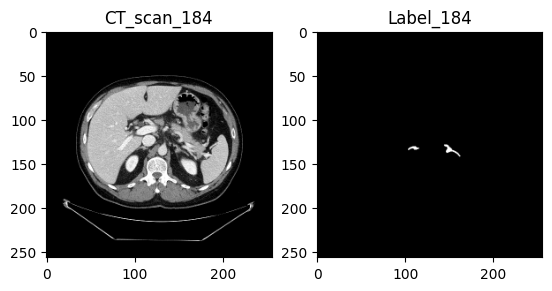

<Figure size 640x480 with 0 Axes>

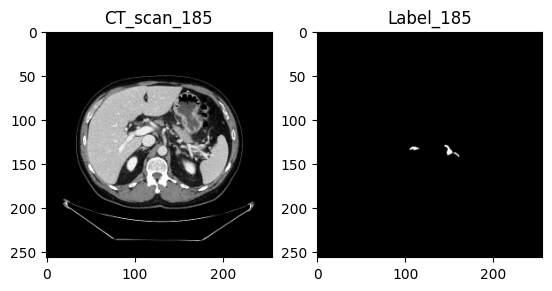

<Figure size 640x480 with 0 Axes>

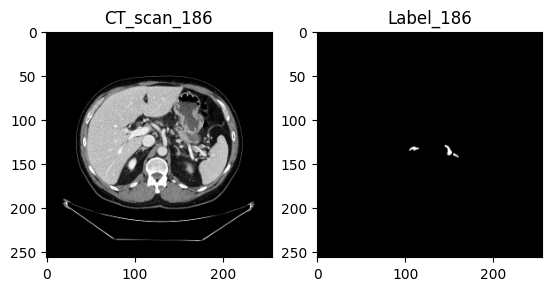

<Figure size 640x480 with 0 Axes>

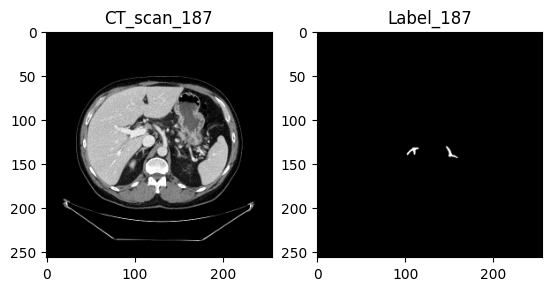

<Figure size 640x480 with 0 Axes>

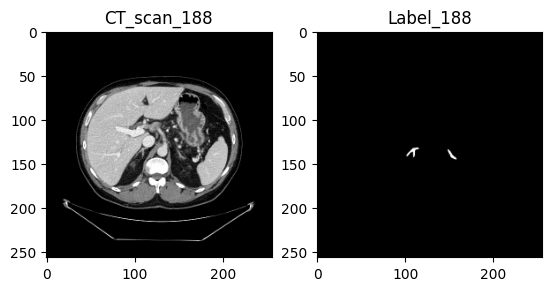

<Figure size 640x480 with 0 Axes>

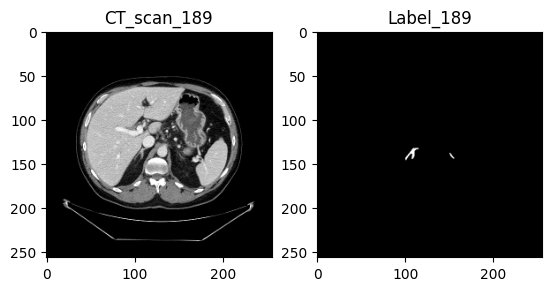

<Figure size 640x480 with 0 Axes>

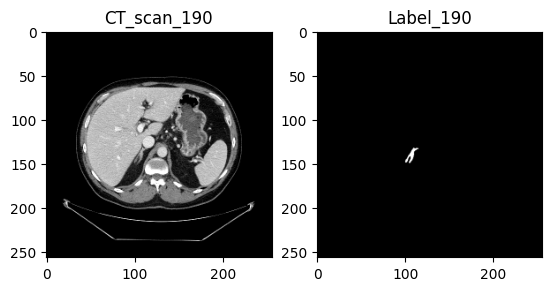

<Figure size 640x480 with 0 Axes>

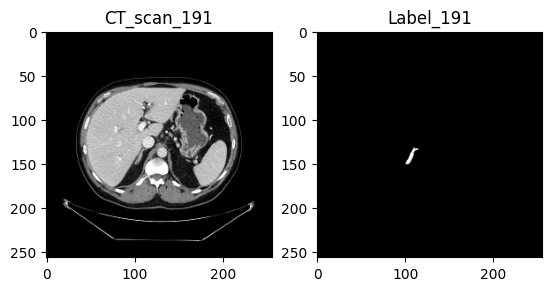

<Figure size 640x480 with 0 Axes>

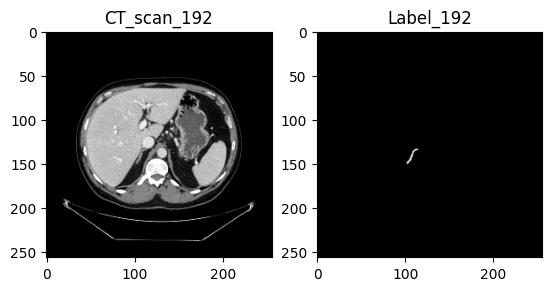

<Figure size 640x480 with 0 Axes>

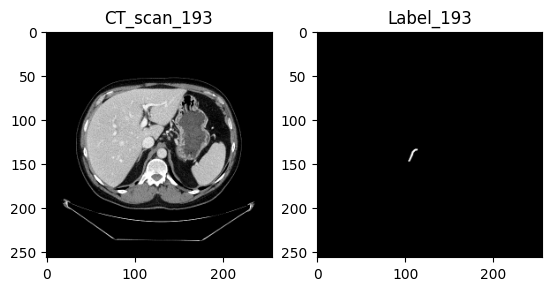

<Figure size 640x480 with 0 Axes>

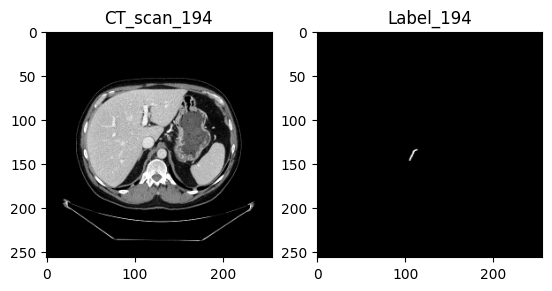

<Figure size 640x480 with 0 Axes>

In [ ]:
# VISUALISATION OF THE TEST DATASET

for i in range(len(test_images)):
    img = test_images[i]
    gt = test_labels[i]

    fig,ax = plt.subplots(1,2)

    ax[0].imshow(img,cmap = 'gray')
    ax[0].set_title(f"CT_scan_{i}")
    ax[1].imshow(gt,cmap = 'gray')
    ax[1].set_title(f"Label_{i}")
    plt.show()
    plt.tight_layout()

In [ ]:
#%% compare the segmentation results between the original SAM model and the fine-tuned model
# load the original SAM model
# ori_sam_model = sam_model_registry[model_type](checkpoint=checkpoint).to(device)
# ori_sam_predictor = SamPredictor(ori_sam_model)

dice = 0
count = 0

for i in range(len(test_images)):


    fig,ax = plt.subplots(1,3)

    # bboxes.append(bbox)
    img = test_images[i]
    gt = test_labels[i]


    bbox = get_bbox_from_mask(gt)
    # bbox = np.array([65,80,180,140])
    # plot_bounding_box(bbox,img)

    # predict the segmentation mask using the original SAM model
    # ori_sam_predictor.set_image(img)
    # ori_sam_seg, _, _ = ori_sam_predictor.predict(point_coords=None, box=bbox, multimask_output=False)
    # ori_sam_segs.append(ori_sam_seg[0])

    # predict the segmentation mask using the fine-tuned model

    ax[0].imshow(img,cmap = 'gray')
    ax[0].set_title(f"CT_Scan_{i}")

    ax[1].imshow(gt,cmap = 'gray')
    ax[1].set_title(f"Label_{i}")

    H, W = img.shape[:2]

    sam_trans = ResizeLongestSide(medsam.image_encoder.img_size)

    resize_img = sam_trans.apply_image(img)

    resize_img_tensor = torch.as_tensor(resize_img.transpose(2, 0, 1)).to(device)

    input_image = medsam.preprocess(resize_img_tensor[None,:,:,:]) # (1, 3, 1024, 1024)

    with torch.no_grad():
        image_embedding = medsam.image_encoder(input_image.to(device)) # (1, 256, 64, 64)
        # convert box to 1024x1024 grid
        bbox = sam_trans.apply_boxes(bbox, (H, W))
        box_torch = torch.as_tensor(bbox, dtype=torch.float, device=device)
        if len(box_torch.shape) == 2:
            box_torch = box_torch[:, None, :] # (B, 1, 4)

        sparse_embeddings, dense_embeddings = medsam.prompt_encoder(
            points=None,
            boxes=box_torch,
            masks=None,
        )
        medsam_seg_prob, _ = medsam.mask_decoder(
            image_embeddings=image_embedding.to(device), # (B, 256, 64, 64)
            image_pe=medsam.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
            sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
            dense_prompt_embeddings=dense_embeddings, # (B, 256, 64, 64)
            multimask_output=False,
        )
        medsam_seg_prob = torch.sigmoid(medsam_seg_prob)
        # convert soft mask to hard mask
        medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
        medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)

        ax[2].imshow(medsam_seg,cmap = 'gray')
        ax[2].set_title(f"Medsam_seg_{i}")

        plt.show()
        plt.tight_layout()

        print()

        dice_set = dice_score_percentage(medsam_seg,gt)
        dice += dice_set
        print("DICE SCORE FOR THIS SET : ",dice_set)
        count+=1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(dice)
print(count)

print("MedSAM DSC : ",dice/count)

3674.81723234702
195
MedSAM DSC :  18.845216576138565
